This example shows a basic example of "Feff fitting" with larch.  

We start with some import statements, then 
   1. read in data for ZnSe, Zn K edge
   2. do background subtraction and plot $\chi(k)$
   3. set the Fourier transform ranges
   4. define a Group of Parameters for the fit
   5. read in a Feff Path for Zn-Se 
   6. run the fit and view the results

In [8]:
# step 0: imports
import sys
sys.path.insert(0, r"C:\Users\kwill\Keenan_UCB-O365\OneDrive_UCB-O365\GitHub_Repos\xraylarch")
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from scipy.interpolate import interp1d
from larch.io import read_athena, read_ascii
from larch.xafs import (pre_edge, autobk, xftf, 
                        ff2chi, feffpath, feffit_transform, feffit_dataset, feffit, feffit_report, TransformGroup, path2chi)
from larch.fitting import param, guess, param_group
from larch.plot.plotly_xafsplots import (plot_mu, plot_chik, plot_chir, plot_chifit, 
                                         multi_plot, plotlabels, set_label_weight)
from larch.utils import group2dict
from pathlib import Path
from larch.wxlib import plotlabels as plab 
from scipy.signal import savgol_filter   
try:
    # Try the newer name first
    from scipy.integrate import simpson as integrate_method
except ImportError:
    try:
        # Try the older name
        from scipy.integrate import simps as integrate_method
    except ImportError:
        # Fall back to trapz which is always available
        from scipy.integrate import trapz as integrate_method
        print("Note: Using trapz for integration instead of simpson/simps")      
import matplotlib.cm as cm  
from larch import Group                                
import os 

from larch.XASmu2r import XASmu2r

In [9]:
# cspbi3 = XASmu2r(Path(r'C:\Users\kwill\Keenan_UCB-O365\OneDrive - UCB-O365\Data\XAS\NSLS-II\AthenaProjectFiles\CsPbI3\final'))
# # cspbi3 = XASmu2r(Path(r'C:\Users\Keenan Wyatt\OneDrive_UCB-O365\Data\XAS\NSLS-II\AthenaProjectFiles\CsPbI3\final'))
# cspbi3.process_athena_projects()
# cspbi3.batch_process_projects()

# cspbi3.apply_self_absorption_correction_all()
# cspbi3.background_optimizer()
# cspbi3.visualize_kw()
# cspbi3.smooth_and_taper_chi_all()
# cspbi3.ft_processing_batch()
# cspbi3.enhanced_verify_modifications()

Loading project file: C:\Users\kwill\Keenan_UCB-O365\OneDrive - UCB-O365\Data\XAS\NSLS-II\AthenaProjectFiles\CsPbI3\low_noise\0p1M_cspbi3_dmso_clean.prj
Loading project file: C:\Users\kwill\Keenan_UCB-O365\OneDrive - UCB-O365\Data\XAS\NSLS-II\AthenaProjectFiles\CsPbI3\low_noise\0p2M_cspbi3_dmso_clean.prj
Loading project file: C:\Users\kwill\Keenan_UCB-O365\OneDrive - UCB-O365\Data\XAS\NSLS-II\AthenaProjectFiles\CsPbI3\low_noise\0p3M_cspbi3_dmso_clean.prj
Loading project file: C:\Users\kwill\Keenan_UCB-O365\OneDrive - UCB-O365\Data\XAS\NSLS-II\AthenaProjectFiles\CsPbI3\low_noise\0p4M_cspbi3_dmso_clean.prj
Loading project file: C:\Users\kwill\Keenan_UCB-O365\OneDrive - UCB-O365\Data\XAS\NSLS-II\AthenaProjectFiles\CsPbI3\low_noise\0p5M_cspbi3_dmso_clean.prj
Loading project file: C:\Users\kwill\Keenan_UCB-O365\OneDrive - UCB-O365\Data\XAS\NSLS-II\AthenaProjectFiles\CsPbI3\low_noise\0p6M_cspbi3_dmso_clean.prj
Loading project file: C:\Users\kwill\Keenan_UCB-O365\OneDrive - UCB-O365\Data\XAS\

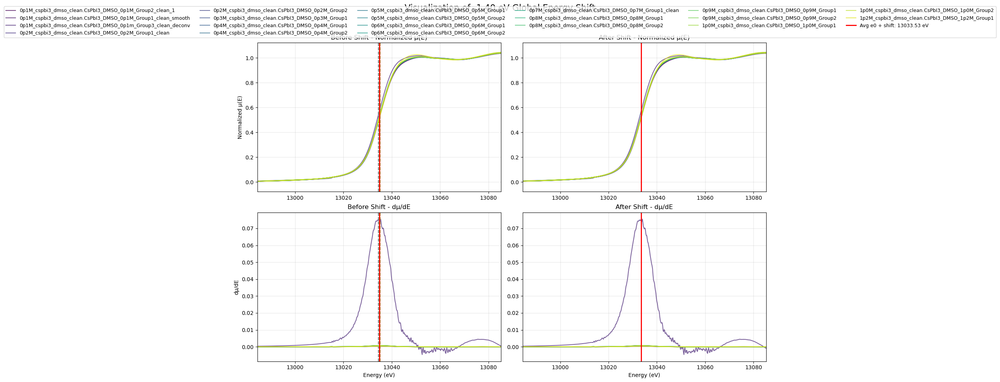

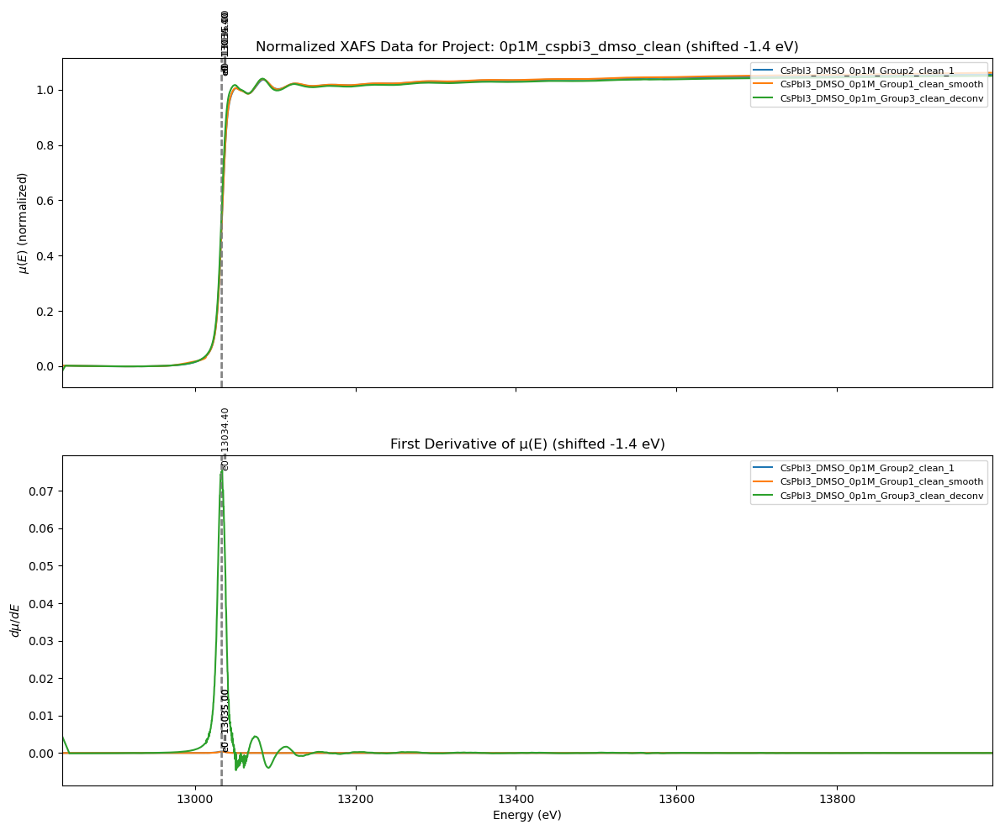

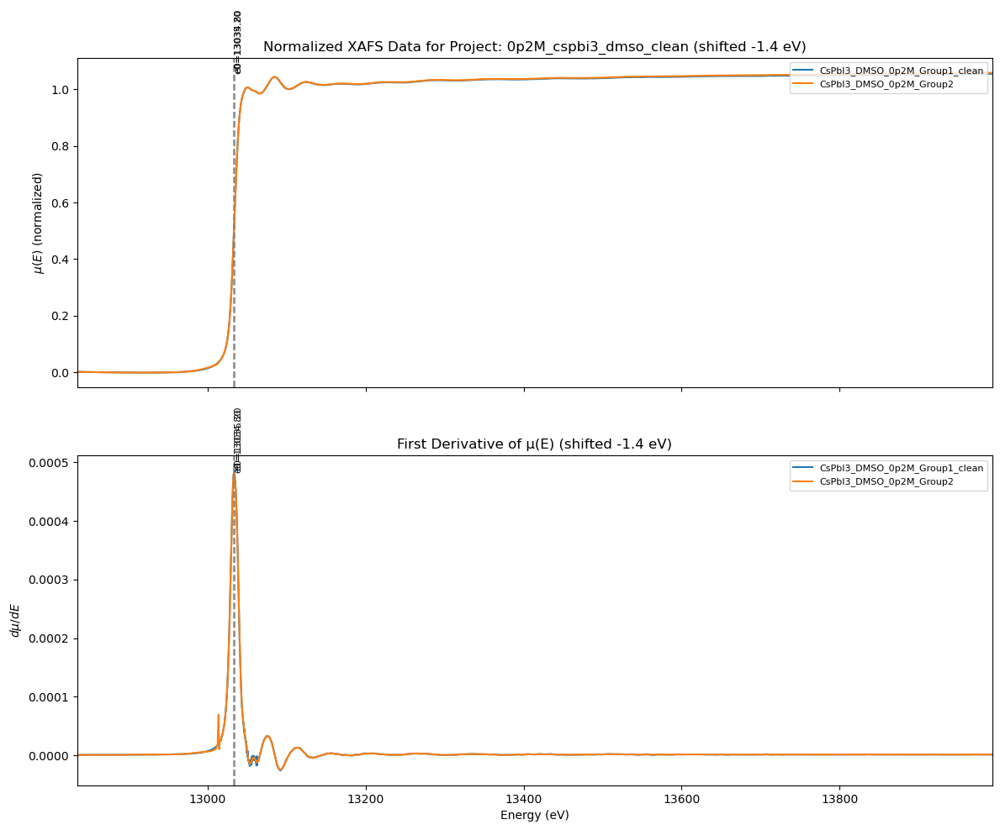

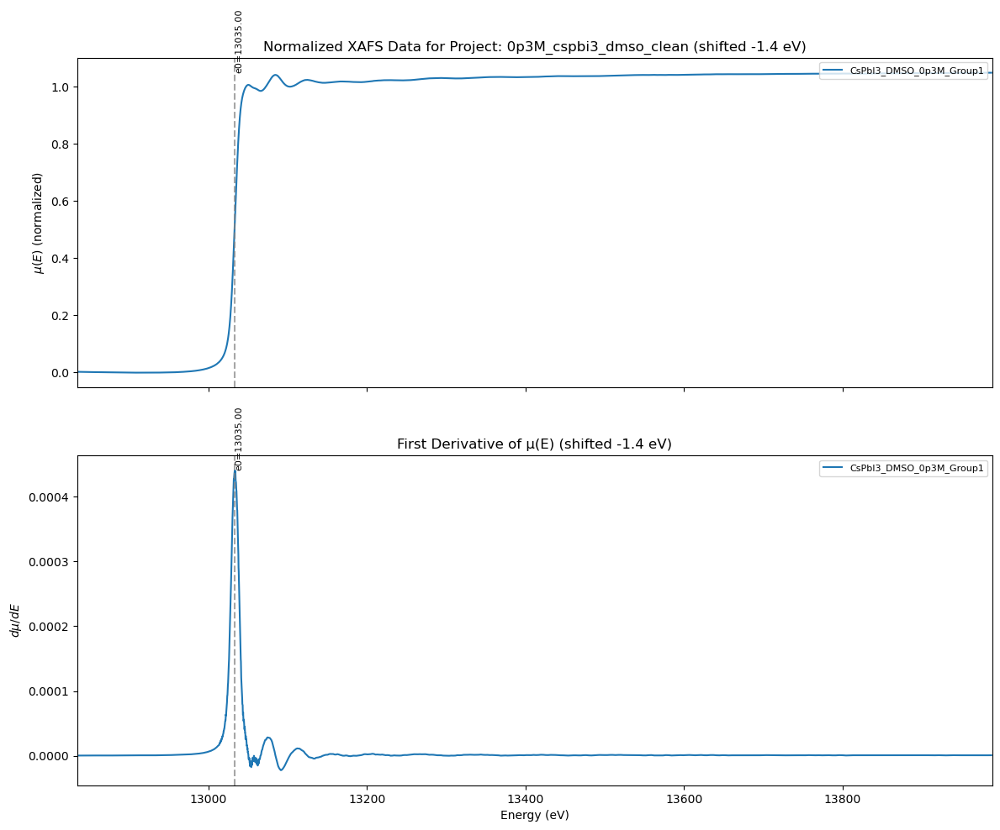

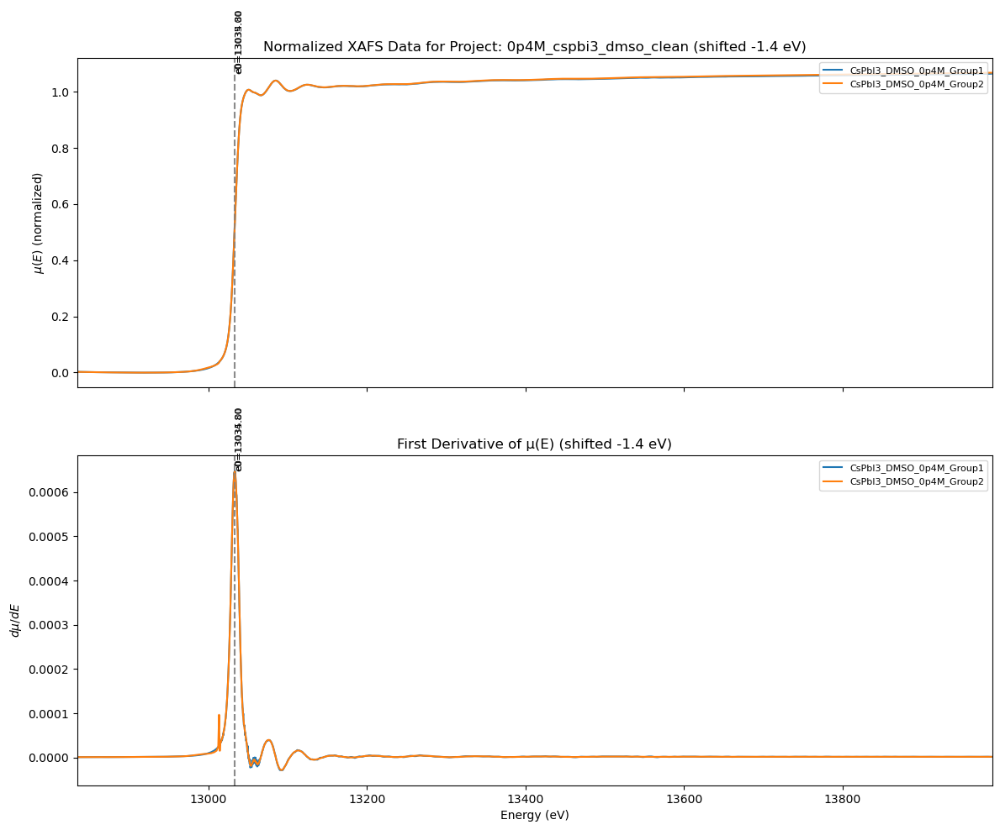

...

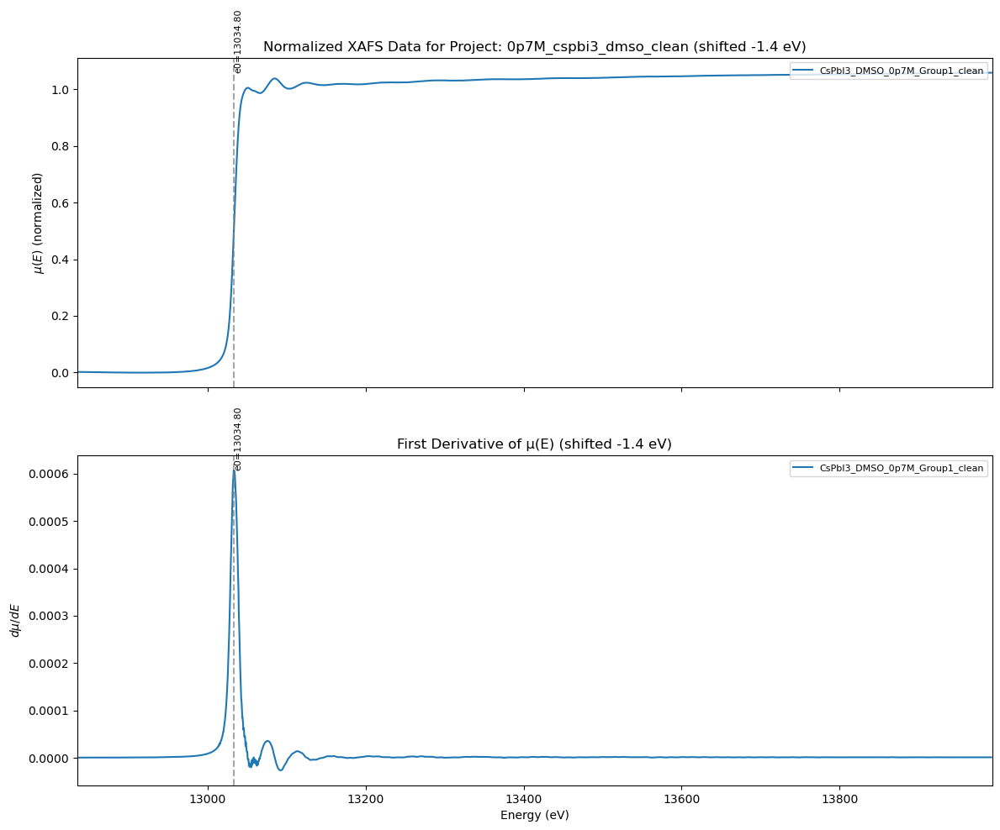

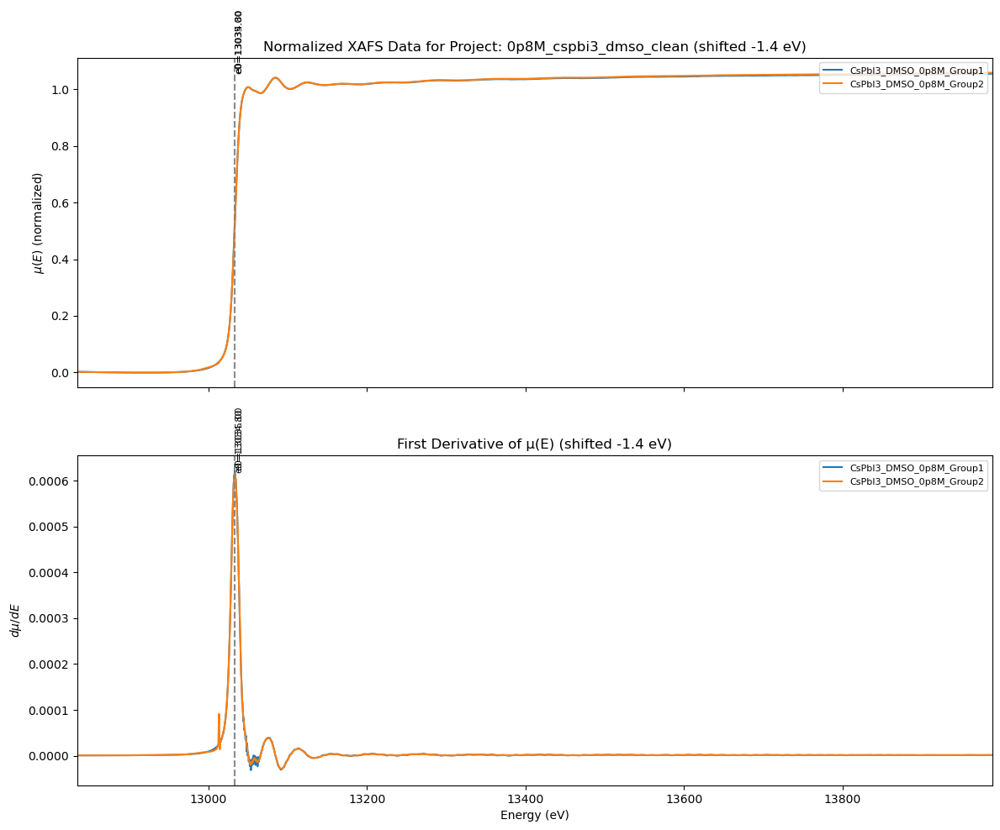

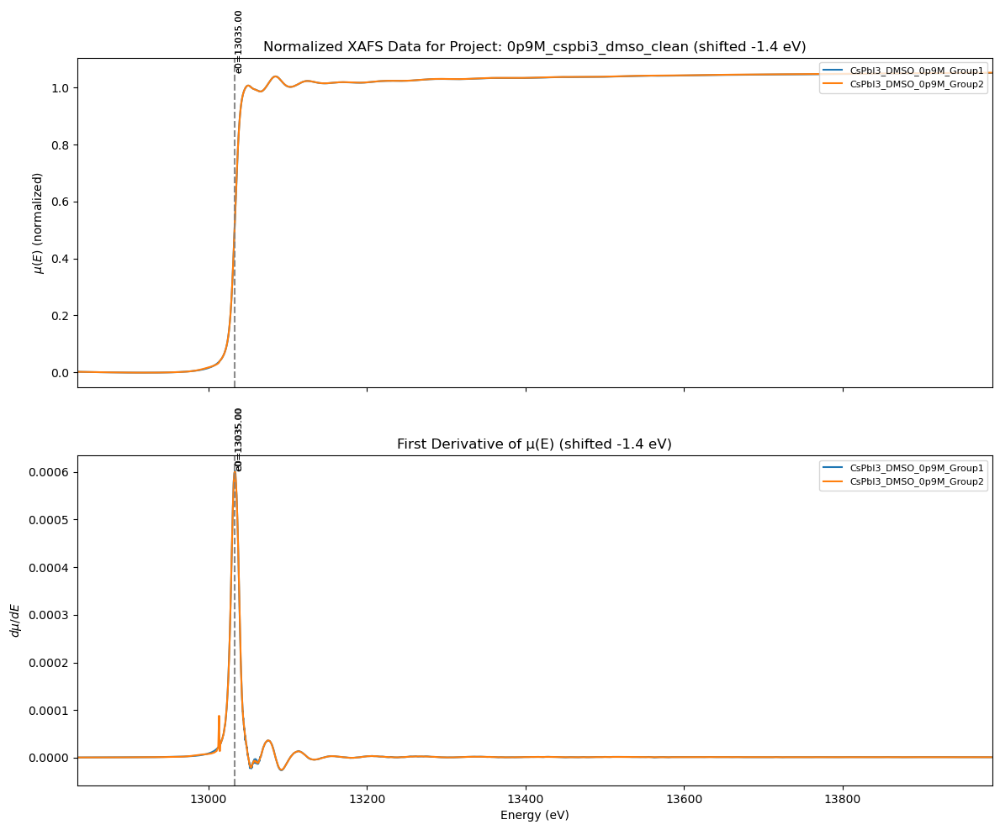

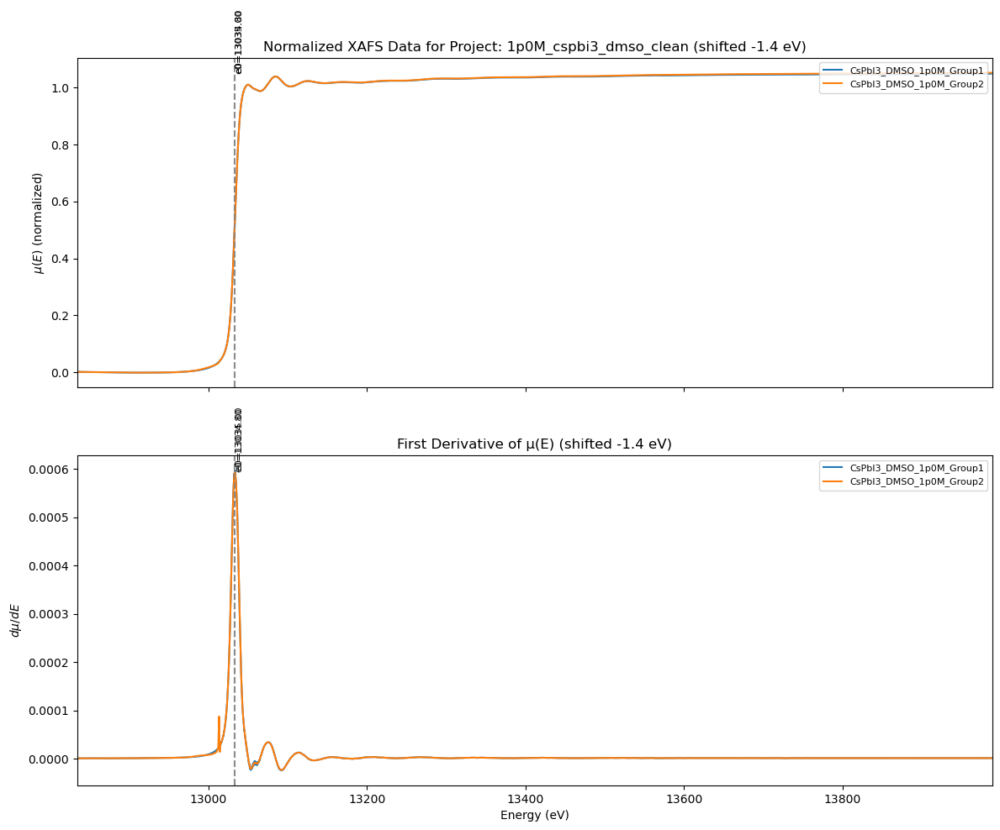

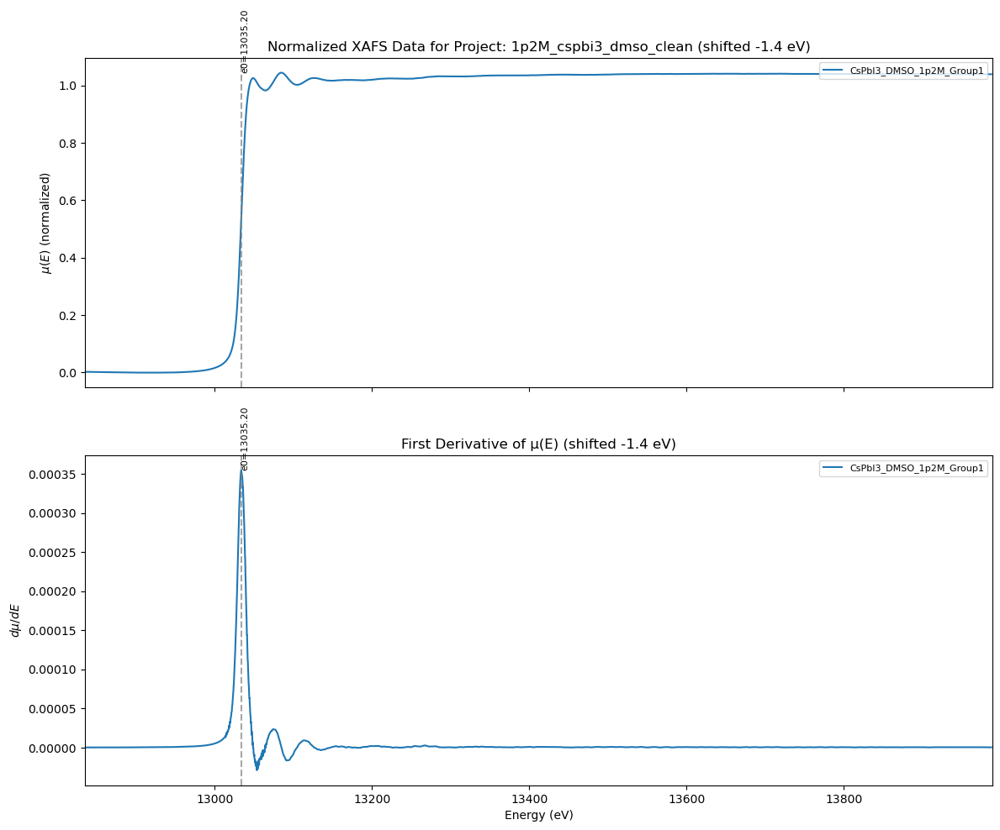


BATCH_PROCESS_PROJECTS SUMMARY
  Projects processed:     11
  Total groups processed: 20
  Global average e0:      13034.93 eV
  Energy shift applied:   -1.40 eV
  e0 averaging enabled:   False
  Smoothing applied:      False
--------------------------------------------------------------------------------
  Group e0 values (after calibration):
    0p1M_cspbi3_dmso_clean.CsPbI3_DMSO_0p1M_Group2_clean_1      e0_orig: 13035.00 eV  ->  e0_calibrated: 13033.60 eV  (shift: -1.40)
    0p1M_cspbi3_dmso_clean.CsPbI3_DMSO_0p1M_Group1_clean_smooth  e0_orig: 13035.00 eV  ->  e0_calibrated: 13033.60 eV  (shift: -1.40)
    0p1M_cspbi3_dmso_clean.CsPbI3_DMSO_0p1m_Group3_clean_deconv  e0_orig: 13034.40 eV  ->  e0_calibrated: 13033.00 eV  (shift: -1.40)
    0p2M_cspbi3_dmso_clean.CsPbI3_DMSO_0p2M_Group1_clean        e0_orig: 13035.20 eV  ->  e0_calibrated: 13033.80 eV  (shift: -1.40)
    0p2M_cspbi3_dmso_clean.CsPbI3_DMSO_0p2M_Group2              e0_orig: 13034.80 eV  ->  e0_calibrated: 13033.40 eV  (

In [10]:
cspbi3 = XASmu2r(Path(r'C:\Users\kwill\Keenan_UCB-O365\OneDrive - UCB-O365\Data\XAS\NSLS-II\AthenaProjectFiles\CsPbI3\low_noise'))
# cspbi3 = XASmu2r(Path(r'C:\Users\Keenan Wyatt\OneDrive_UCB-O365\Data\XAS\NSLS-II\AthenaProjectFiles\CsPbI3\final'))
cspbi3.process_athena_projects()
# cspbi3.batch_process_projects(smooth=True)
cspbi3.batch_process_projects(smooth = False, window_length =21, polyorder=3, shift=-1.4, average= False)

Applying self-absorption correction (FLUO algorithm) to all groups...
  Settings: elem=Pb, edge=L3, line=La, anginp=45.0°, angout=45.0°
  Using solution model: accounting for solute + DMSO solvent

  Processing '0p1M_cspbi3_dmso_clean/CsPbI3_DMSO_0p1M_Group2_clean_1'...
    Parsed formula: CsPbI3, concentration: 0.100 M
    Solution density: 1.1588 g/mL
    Effective solution formula: CsPbI3C278H835O139S139
    ✓ Applied FLUO correction

  Processing '0p1M_cspbi3_dmso_clean/CsPbI3_DMSO_0p1M_Group1_clean_smooth'...
    Parsed formula: CsPbI3, concentration: 0.100 M
    Solution density: 1.1588 g/mL
    Effective solution formula: CsPbI3C278H835O139S139
    ✓ Applied FLUO correction

  Processing '0p1M_cspbi3_dmso_clean/CsPbI3_DMSO_0p1m_Group3_clean_deconv'...
    Parsed formula: CsPbI3, concentration: 0.100 M
    Solution density: 1.1588 g/mL
    Effective solution formula: CsPbI3C278H835O139S139
    ✓ Applied FLUO correction

  Processing '0p2M_cspbi3_dmso_clean/CsPbI3_DMSO_0p2M_Group1

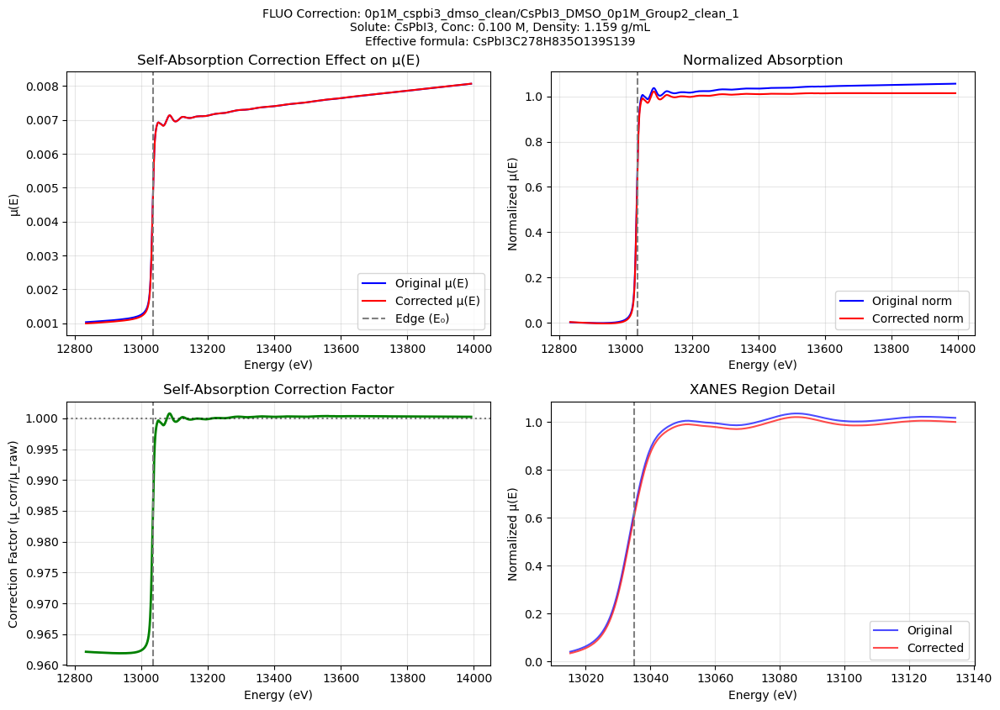

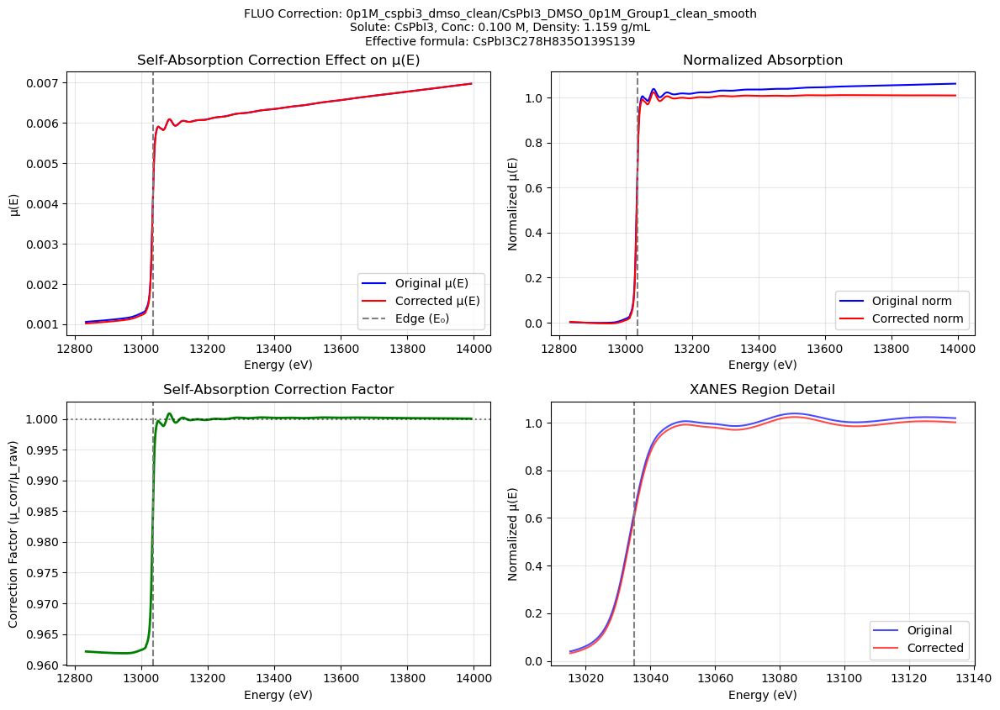

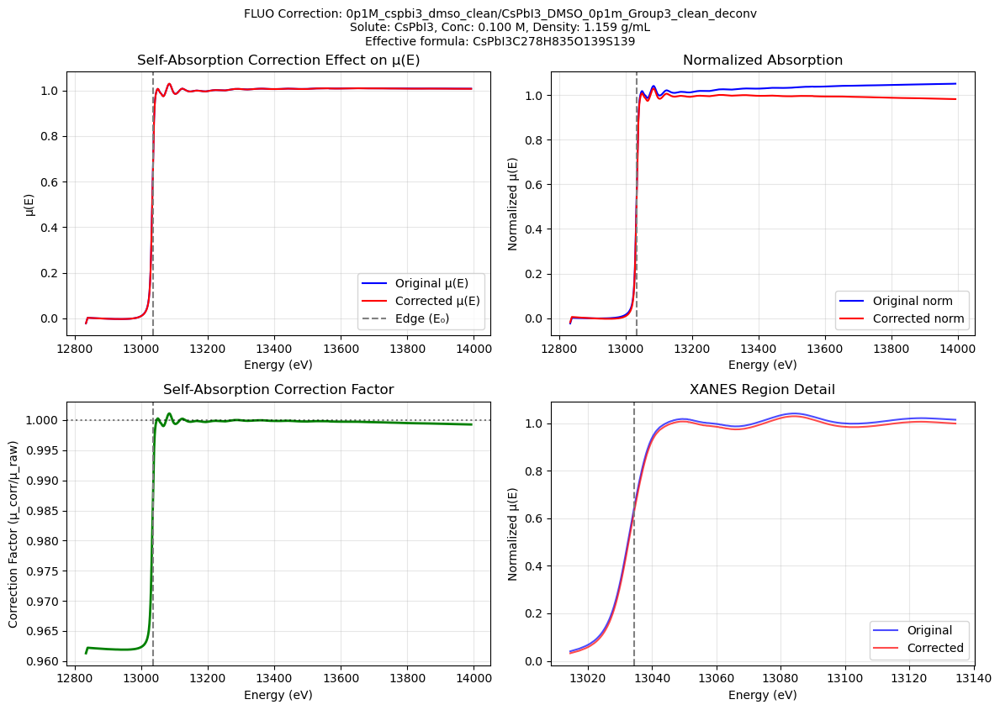


APPLY_SELF_ABSORPTION_CORRECTION_ALL SUMMARY
  Processed groups:        20
  Skipped groups:          0
  Absorbing element:       Pb (L3 edge)
  Fluorescence line:       La
  Input/output angles:     45.0° / 45.0°
--------------------------------------------------------------------------------
  Correction details per group:
    0p1M_cspbi3_dmso_clean.CsPbI3_DMSO_0p1M_Group2_clean_1    
      Formula: CsPbI3, Conc: 0.100 M, Density: 1.159 g/mL
      Effective formula: CsPbI3C278H835O139S139
      Avg correction factor: 0.9917
    0p1M_cspbi3_dmso_clean.CsPbI3_DMSO_0p1M_Group1_clean_smooth
      Formula: CsPbI3, Conc: 0.100 M, Density: 1.159 g/mL
      Effective formula: CsPbI3C278H835O139S139
      Avg correction factor: 0.9917
    0p1M_cspbi3_dmso_clean.CsPbI3_DMSO_0p1m_Group3_clean_deconv
      Formula: CsPbI3, Conc: 0.100 M, Density: 1.159 g/mL
      Effective formula: CsPbI3C278H835O139S139
      Avg correction factor: 0.9919
    0p2M_cspbi3_dmso_clean.CsPbI3_DMSO_0p2M_Group1_cle

In [11]:
cspbi3.apply_self_absorption_correction_all()

ALTERNATING RBKG/KMIN BACKGROUND OPTIMIZATION
Optimization sequence: rbkg → kmin → rbkg → kmin
Fixed kmax = 14.50 Å⁻¹ (not optimized)
Convergence tolerances: rbkg=0.010, kmin=0.020 Å⁻¹
kmin range: (0.8, 2.0)
rbkg range: (0.9, 1.5)

Processing Project: 0p1M_cspbi3_dmso_clean

  Processing group: CsPbI3_DMSO_0p1M_Group2_clean_1
  ----------------------------------------

  Fixed kmax = 14.50 Å⁻¹
  Starting alternating optimization...
  Initial: rbkg=1.000, kmin=1.00

  [Step 1/4] Optimizing rbkg...
    rbkg: 1.000 → 1.059

  [Step 2/4] Optimizing kmin...
    kmin: 1.000 → 1.100

  [Step 3/4] Optimizing rbkg...
    rbkg: 1.059 → 1.182 (Δ=0.1224)

  [Step 4/4] Optimizing kmin...
    kmin: 1.100 → 1.160 (Δ=0.0600)
  ⚠ Not fully converged (Δrbkg=0.1224, Δkmin=0.0600)

  Determining clamp values...
    clamp_hi = 40
    clamp_lo = 20

  Applying final parameters...

  ⚠ not converged for CsPbI3_DMSO_0p1M_Group2_clean_1
    kmax = 14.50 Å⁻¹ (fixed)
    kmin = 1.160 Å⁻¹
    rbkg = 1.182
    ste

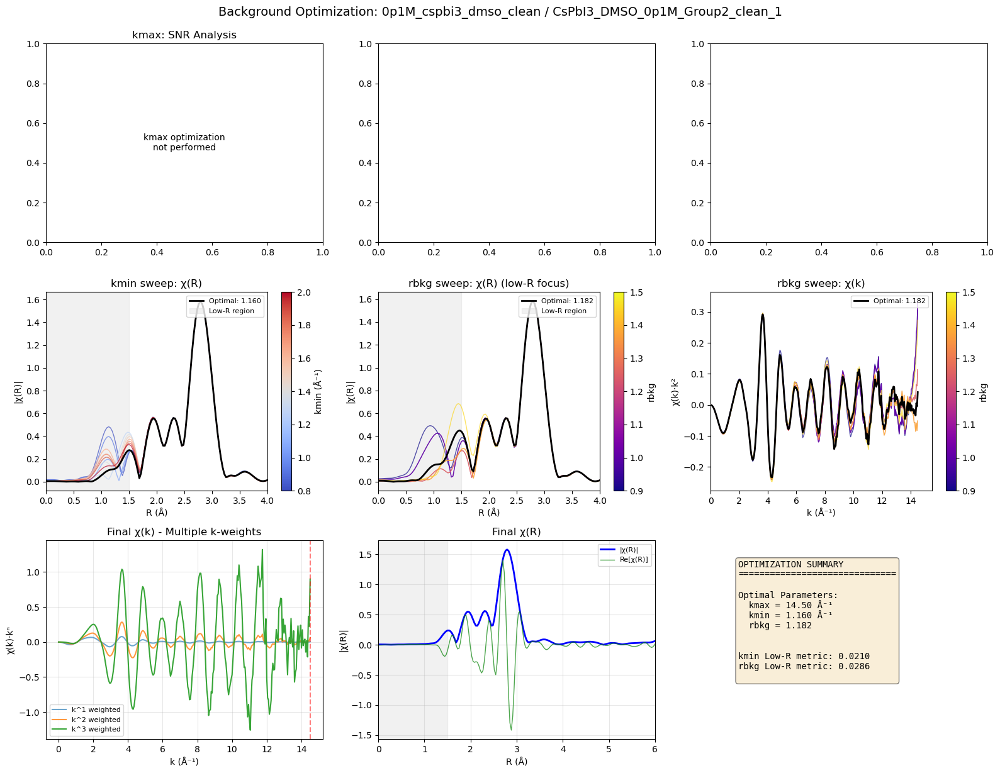


  Processing group: CsPbI3_DMSO_0p1M_Group1_clean_smooth
  ----------------------------------------

  Fixed kmax = 14.50 Å⁻¹
  Starting alternating optimization...
  Initial: rbkg=1.000, kmin=1.00

  [Step 1/4] Optimizing rbkg...
    rbkg: 1.000 → 1.059

  [Step 2/4] Optimizing kmin...
    kmin: 1.000 → 1.120

  [Step 3/4] Optimizing rbkg...
    rbkg: 1.059 → 1.059 (Δ=0.0000)

  [Step 4/4] Optimizing kmin...
    kmin: 1.120 → 1.120 (Δ=0.0000)
  ✓ CONVERGED (Δrbkg=0.0000 < 0.01, Δkmin=0.0000 < 0.02)

  Determining clamp values...
    clamp_hi = 30
    clamp_lo = 20

  Applying final parameters...

  ✓ CONVERGED for CsPbI3_DMSO_0p1M_Group1_clean_smooth
    kmax = 14.50 Å⁻¹ (fixed)
    kmin = 1.120 Å⁻¹
    rbkg = 1.059
    steps = 4
    clamp_hi = 30, clamp_lo = 20


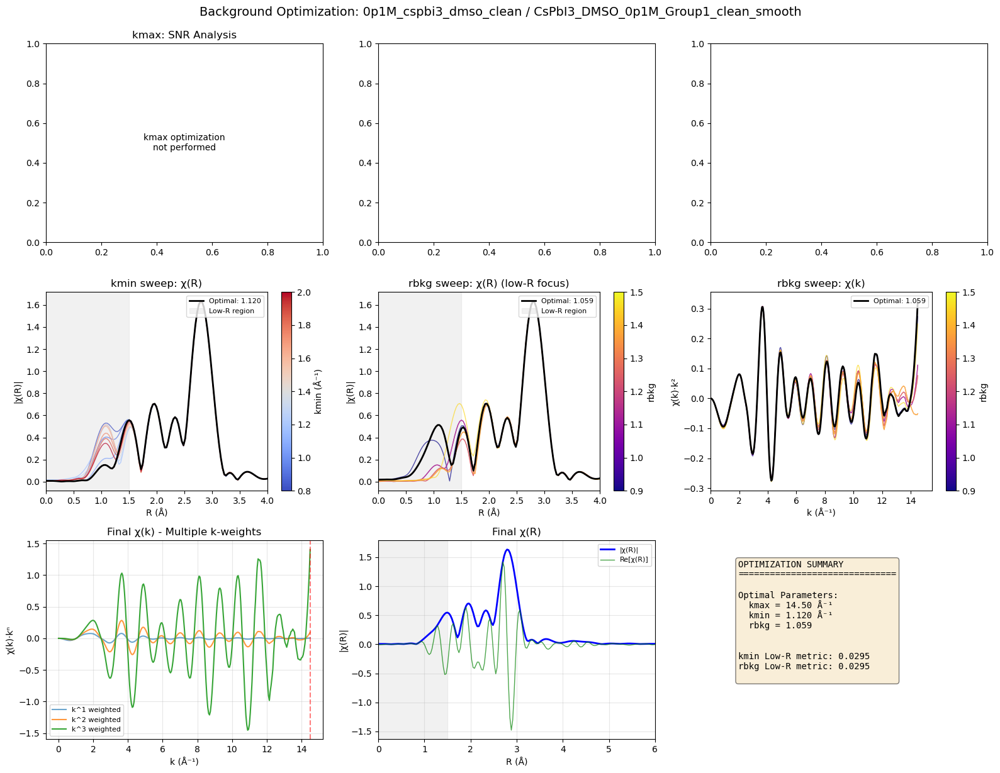


  Processing group: CsPbI3_DMSO_0p1m_Group3_clean_deconv
  ----------------------------------------

  Fixed kmax = 14.50 Å⁻¹
  Starting alternating optimization...
  Initial: rbkg=1.000, kmin=1.00

  [Step 1/4] Optimizing rbkg...
    rbkg: 1.000 → 1.059

  [Step 2/4] Optimizing kmin...
    kmin: 1.000 → 1.120

  [Step 3/4] Optimizing rbkg...
    rbkg: 1.059 → 1.059 (Δ=0.0000)

  [Step 4/4] Optimizing kmin...
    kmin: 1.120 → 1.120 (Δ=0.0000)
  ✓ CONVERGED (Δrbkg=0.0000 < 0.01, Δkmin=0.0000 < 0.02)

  Determining clamp values...
    clamp_hi = 40
    clamp_lo = 20

  Applying final parameters...

  ✓ CONVERGED for CsPbI3_DMSO_0p1m_Group3_clean_deconv
    kmax = 14.50 Å⁻¹ (fixed)
    kmin = 1.120 Å⁻¹
    rbkg = 1.059
    steps = 4
    clamp_hi = 40, clamp_lo = 20


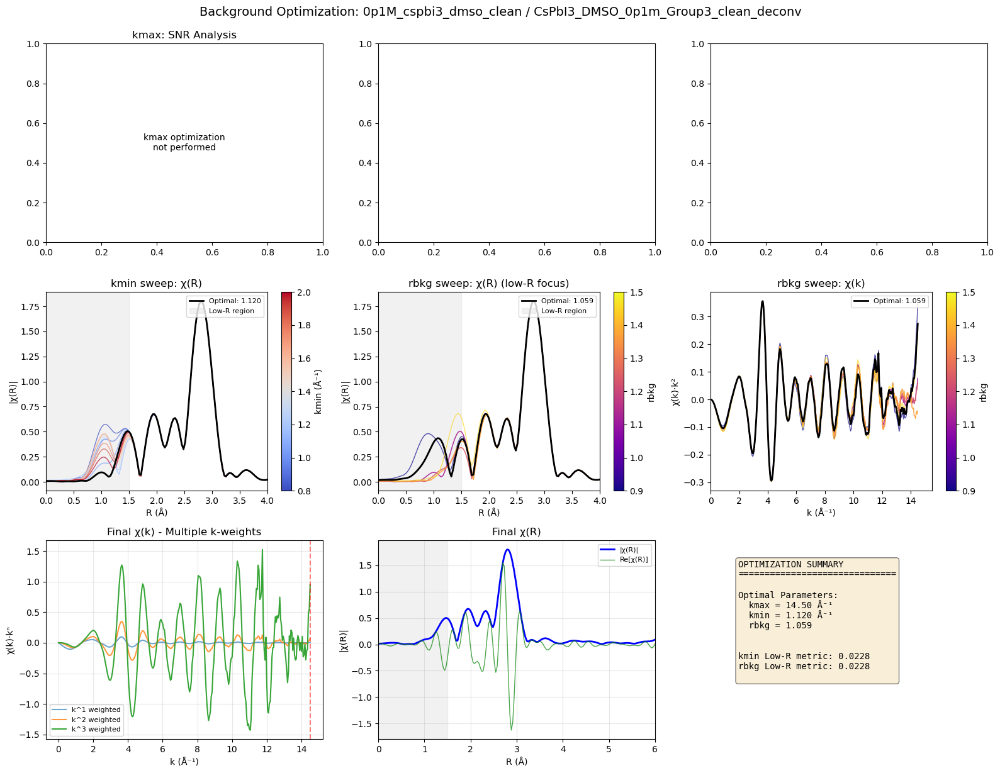


Processing Project: 0p2M_cspbi3_dmso_clean

  Processing group: CsPbI3_DMSO_0p2M_Group1_clean
  ----------------------------------------

  Fixed kmax = 14.50 Å⁻¹
  Starting alternating optimization...
  Initial: rbkg=1.000, kmin=1.00

  [Step 1/4] Optimizing rbkg...
    rbkg: 1.000 → 1.059

  [Step 2/4] Optimizing kmin...
    kmin: 1.000 → 1.120

  [Step 3/4] Optimizing rbkg...
    rbkg: 1.059 → 1.059 (Δ=0.0000)

  [Step 4/4] Optimizing kmin...
    kmin: 1.120 → 1.120 (Δ=0.0000)
  ✓ CONVERGED (Δrbkg=0.0000 < 0.01, Δkmin=0.0000 < 0.02)

  Determining clamp values...
    clamp_hi = 40
    clamp_lo = 20

  Applying final parameters...

  ✓ CONVERGED for CsPbI3_DMSO_0p2M_Group1_clean
    kmax = 14.50 Å⁻¹ (fixed)
    kmin = 1.120 Å⁻¹
    rbkg = 1.059
    steps = 4
    clamp_hi = 40, clamp_lo = 20


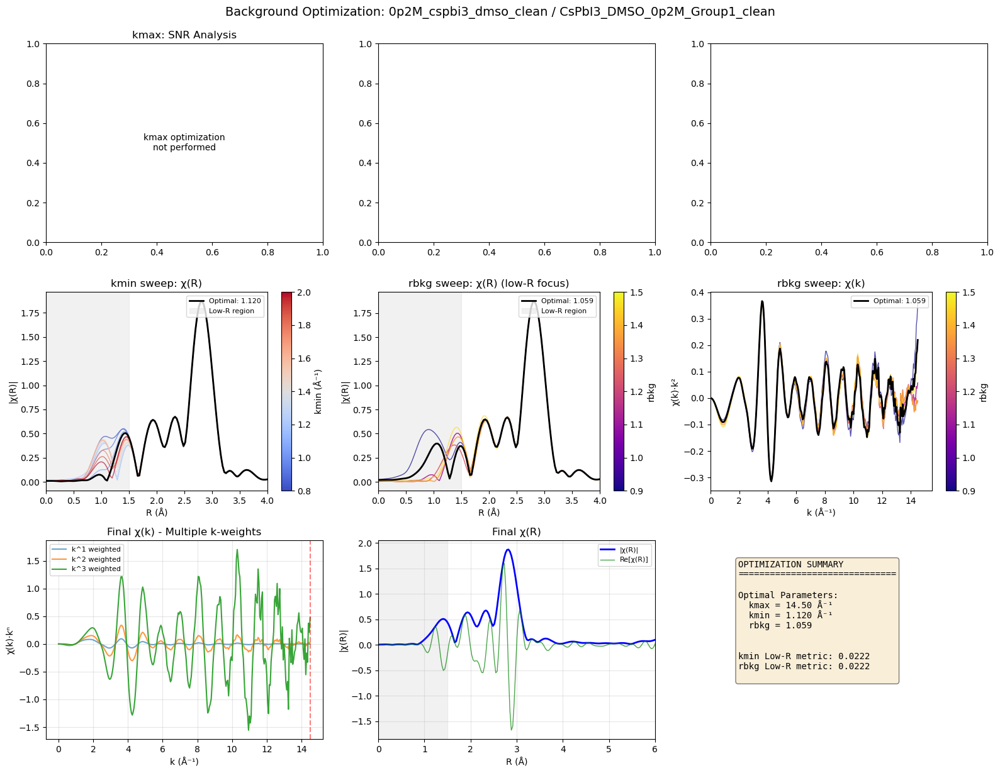


  Processing group: CsPbI3_DMSO_0p2M_Group2
  ----------------------------------------

  Fixed kmax = 14.50 Å⁻¹
  Starting alternating optimization...
  Initial: rbkg=1.000, kmin=1.00

  [Step 1/4] Optimizing rbkg...
    rbkg: 1.000 → 1.059

  [Step 2/4] Optimizing kmin...
    kmin: 1.000 → 1.140

  [Step 3/4] Optimizing rbkg...
    rbkg: 1.059 → 1.059 (Δ=0.0000)

  [Step 4/4] Optimizing kmin...
    kmin: 1.140 → 1.140 (Δ=0.0000)
  ✓ CONVERGED (Δrbkg=0.0000 < 0.01, Δkmin=0.0000 < 0.02)

  Determining clamp values...
    clamp_hi = 30
    clamp_lo = 20

  Applying final parameters...

  ✓ CONVERGED for CsPbI3_DMSO_0p2M_Group2
    kmax = 14.50 Å⁻¹ (fixed)
    kmin = 1.140 Å⁻¹
    rbkg = 1.059
    steps = 4
    clamp_hi = 30, clamp_lo = 20


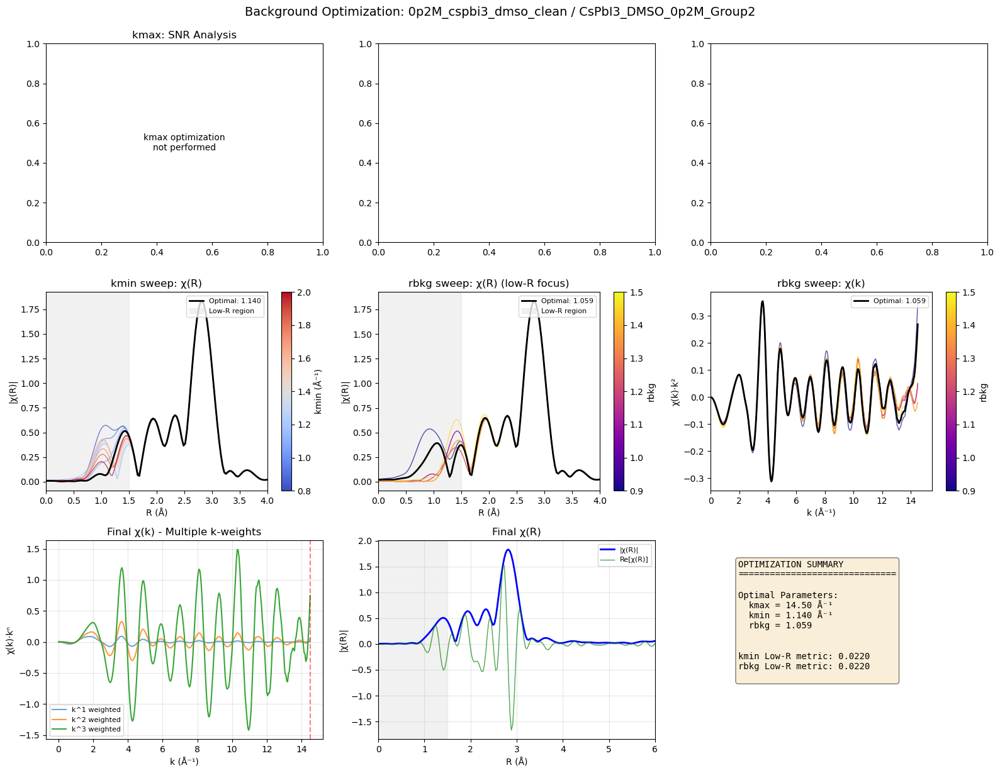


Processing Project: 0p3M_cspbi3_dmso_clean

  Processing group: CsPbI3_DMSO_0p3M_Group1
  ----------------------------------------

  Fixed kmax = 14.50 Å⁻¹
  Starting alternating optimization...
  Initial: rbkg=1.000, kmin=1.00

  [Step 1/4] Optimizing rbkg...
    rbkg: 1.000 → 1.059

  [Step 2/4] Optimizing kmin...
    kmin: 1.000 → 1.100

  [Step 3/4] Optimizing rbkg...
    rbkg: 1.059 → 1.059 (Δ=0.0000)

  [Step 4/4] Optimizing kmin...
    kmin: 1.100 → 1.100 (Δ=0.0000)
  ✓ CONVERGED (Δrbkg=0.0000 < 0.01, Δkmin=0.0000 < 0.02)

  Determining clamp values...
    clamp_hi = 30
    clamp_lo = 20

  Applying final parameters...

  ✓ CONVERGED for CsPbI3_DMSO_0p3M_Group1
    kmax = 14.50 Å⁻¹ (fixed)
    kmin = 1.100 Å⁻¹
    rbkg = 1.059
    steps = 4
    clamp_hi = 30, clamp_lo = 20


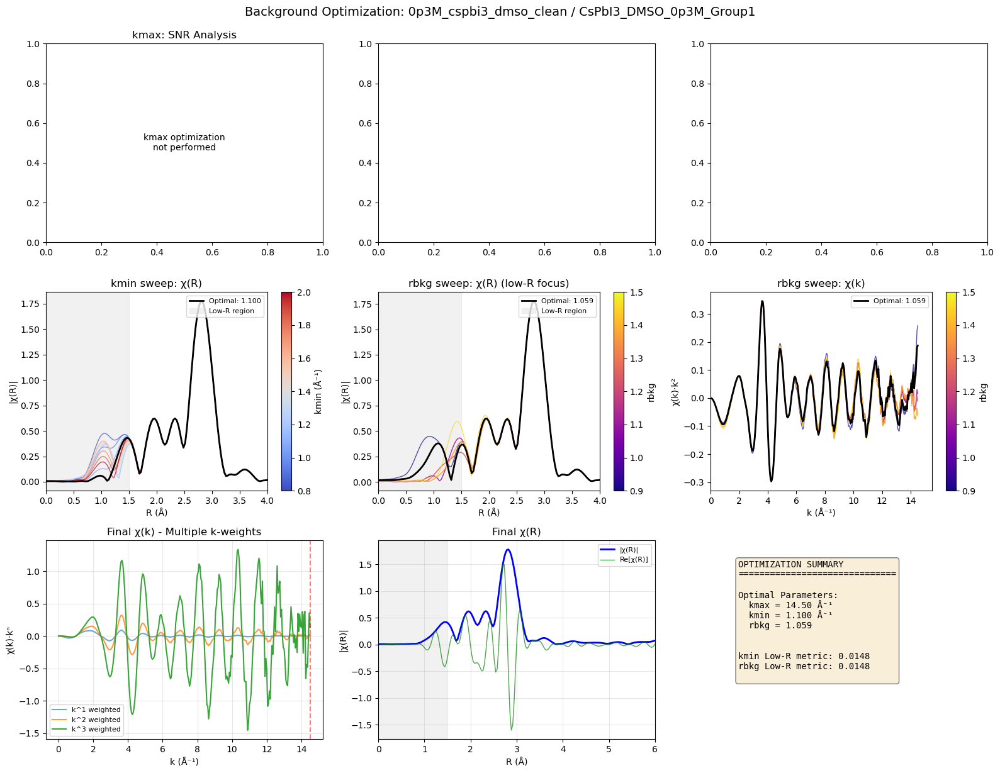


Processing Project: 0p4M_cspbi3_dmso_clean

  Processing group: CsPbI3_DMSO_0p4M_Group1
  ----------------------------------------

  Fixed kmax = 14.50 Å⁻¹
  Starting alternating optimization...
  Initial: rbkg=1.000, kmin=1.00

  [Step 1/4] Optimizing rbkg...
    rbkg: 1.000 → 1.059

  [Step 2/4] Optimizing kmin...
    kmin: 1.000 → 1.140

  [Step 3/4] Optimizing rbkg...
    rbkg: 1.059 → 1.059 (Δ=0.0000)

  [Step 4/4] Optimizing kmin...
    kmin: 1.140 → 1.140 (Δ=0.0000)
  ✓ CONVERGED (Δrbkg=0.0000 < 0.01, Δkmin=0.0000 < 0.02)

  Determining clamp values...
    clamp_hi = 40
    clamp_lo = 20

  Applying final parameters...

  ✓ CONVERGED for CsPbI3_DMSO_0p4M_Group1
    kmax = 14.50 Å⁻¹ (fixed)
    kmin = 1.140 Å⁻¹
    rbkg = 1.059
    steps = 4
    clamp_hi = 40, clamp_lo = 20


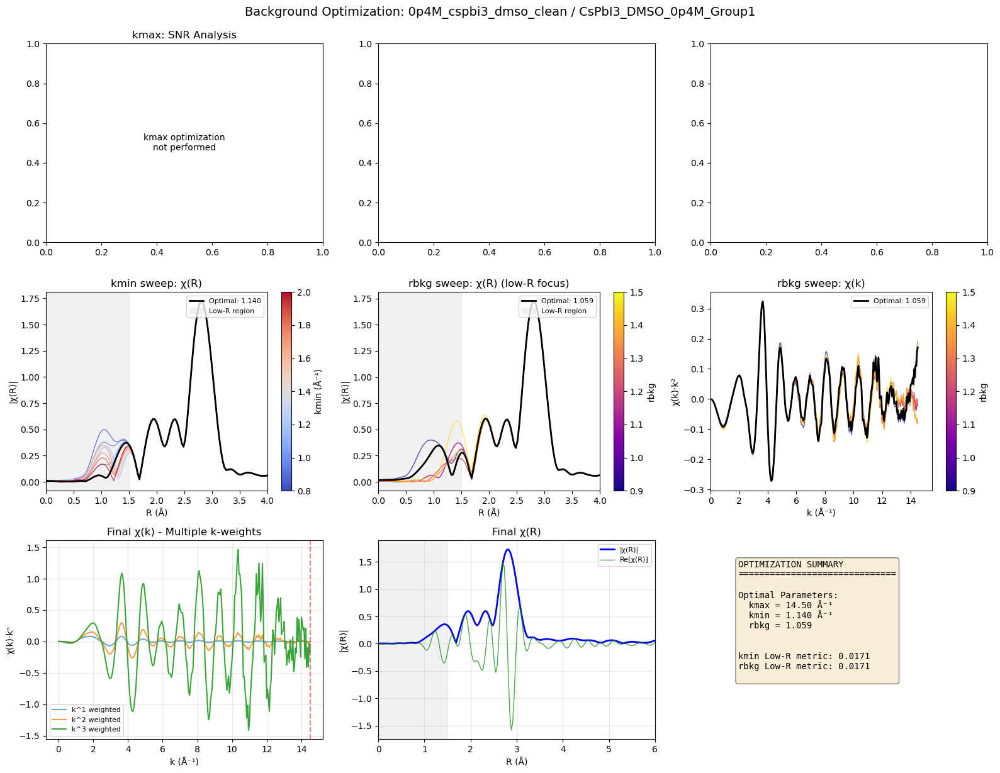


  Processing group: CsPbI3_DMSO_0p4M_Group2
  ----------------------------------------

  Fixed kmax = 14.50 Å⁻¹
  Starting alternating optimization...
  Initial: rbkg=1.000, kmin=1.00

  [Step 1/4] Optimizing rbkg...
    rbkg: 1.000 → 1.059

  [Step 2/4] Optimizing kmin...
    kmin: 1.000 → 1.120

  [Step 3/4] Optimizing rbkg...
    rbkg: 1.059 → 1.059 (Δ=0.0000)

  [Step 4/4] Optimizing kmin...
    kmin: 1.120 → 1.120 (Δ=0.0000)
  ✓ CONVERGED (Δrbkg=0.0000 < 0.01, Δkmin=0.0000 < 0.02)

  Determining clamp values...
    clamp_hi = 30
    clamp_lo = 20

  Applying final parameters...

  ✓ CONVERGED for CsPbI3_DMSO_0p4M_Group2
    kmax = 14.50 Å⁻¹ (fixed)
    kmin = 1.120 Å⁻¹
    rbkg = 1.059
    steps = 4
    clamp_hi = 30, clamp_lo = 20


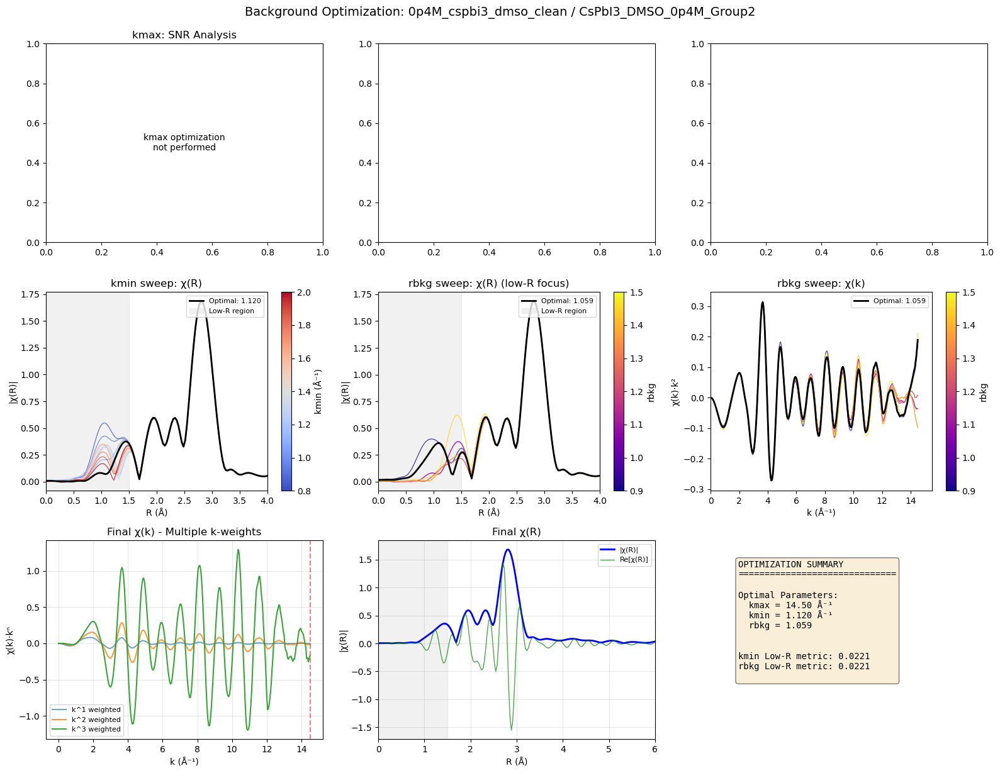


Processing Project: 0p5M_cspbi3_dmso_clean

  Processing group: CsPbI3_DMSO_0p5M_Group1
  ----------------------------------------

  Fixed kmax = 14.50 Å⁻¹
  Starting alternating optimization...
  Initial: rbkg=1.000, kmin=1.00

  [Step 1/4] Optimizing rbkg...
    rbkg: 1.000 → 1.059

  [Step 2/4] Optimizing kmin...
    kmin: 1.000 → 1.120

  [Step 3/4] Optimizing rbkg...
    rbkg: 1.059 → 1.059 (Δ=0.0000)

  [Step 4/4] Optimizing kmin...
    kmin: 1.120 → 1.120 (Δ=0.0000)
  ✓ CONVERGED (Δrbkg=0.0000 < 0.01, Δkmin=0.0000 < 0.02)

  Determining clamp values...
    clamp_hi = 40
    clamp_lo = 20

  Applying final parameters...

  ✓ CONVERGED for CsPbI3_DMSO_0p5M_Group1
    kmax = 14.50 Å⁻¹ (fixed)
    kmin = 1.120 Å⁻¹
    rbkg = 1.059
    steps = 4
    clamp_hi = 40, clamp_lo = 20


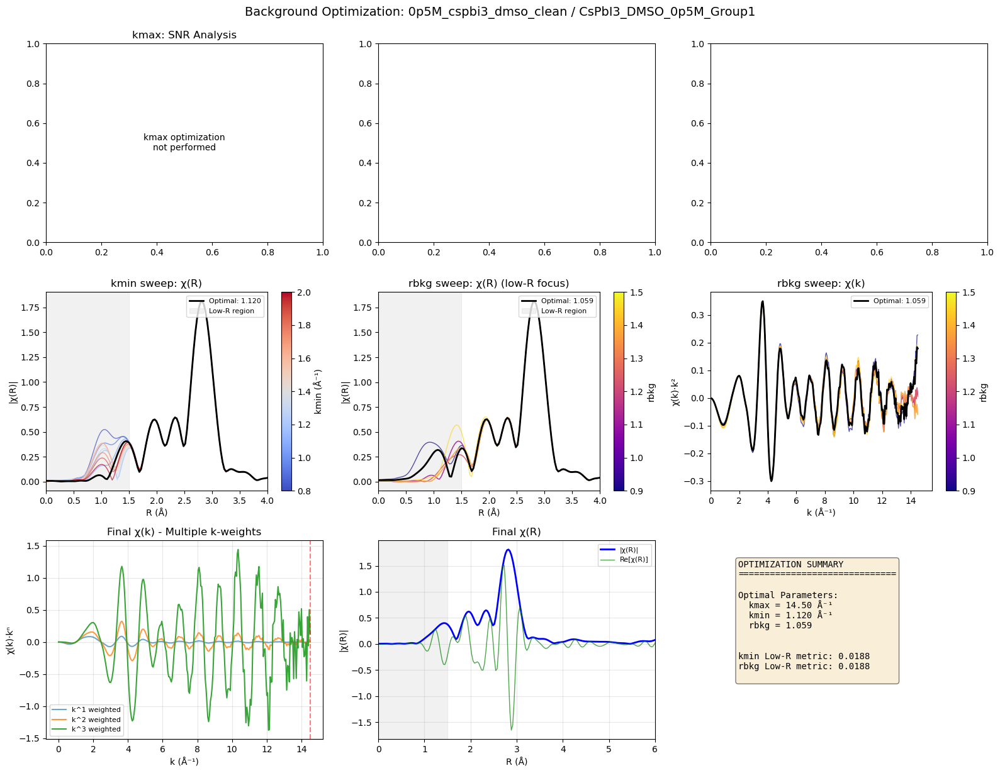


  Processing group: CsPbI3_DMSO_0p5M_Group2
  ----------------------------------------

  Fixed kmax = 14.50 Å⁻¹
  Starting alternating optimization...
  Initial: rbkg=1.000, kmin=1.00

  [Step 1/4] Optimizing rbkg...
    rbkg: 1.000 → 1.059

  [Step 2/4] Optimizing kmin...
    kmin: 1.000 → 1.120

  [Step 3/4] Optimizing rbkg...
    rbkg: 1.059 → 1.059 (Δ=0.0000)

  [Step 4/4] Optimizing kmin...
    kmin: 1.120 → 1.120 (Δ=0.0000)
  ✓ CONVERGED (Δrbkg=0.0000 < 0.01, Δkmin=0.0000 < 0.02)

  Determining clamp values...
    clamp_hi = 30
    clamp_lo = 20

  Applying final parameters...

  ✓ CONVERGED for CsPbI3_DMSO_0p5M_Group2
    kmax = 14.50 Å⁻¹ (fixed)
    kmin = 1.120 Å⁻¹
    rbkg = 1.059
    steps = 4
    clamp_hi = 30, clamp_lo = 20


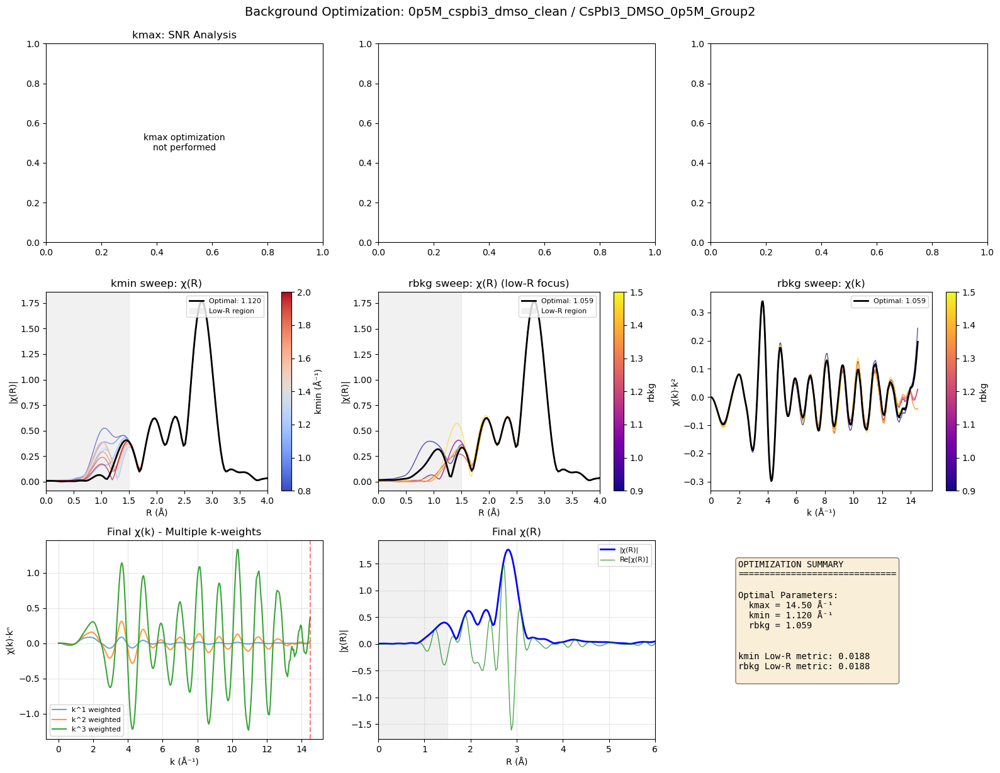


Processing Project: 0p6M_cspbi3_dmso_clean

  Processing group: CsPbI3_DMSO_0p6M_Group1
  ----------------------------------------

  Fixed kmax = 14.50 Å⁻¹
  Starting alternating optimization...
  Initial: rbkg=1.000, kmin=1.00

  [Step 1/4] Optimizing rbkg...
    rbkg: 1.000 → 1.059

  [Step 2/4] Optimizing kmin...
    kmin: 1.000 → 1.140

  [Step 3/4] Optimizing rbkg...
    rbkg: 1.059 → 1.182 (Δ=0.1224)

  [Step 4/4] Optimizing kmin...
    kmin: 1.140 → 1.100 (Δ=0.0400)
  ⚠ Not fully converged (Δrbkg=0.1224, Δkmin=0.0400)

  Determining clamp values...
    clamp_hi = 40
    clamp_lo = 20

  Applying final parameters...

  ⚠ not converged for CsPbI3_DMSO_0p6M_Group1
    kmax = 14.50 Å⁻¹ (fixed)
    kmin = 1.100 Å⁻¹
    rbkg = 1.182
    steps = 4
    clamp_hi = 40, clamp_lo = 20


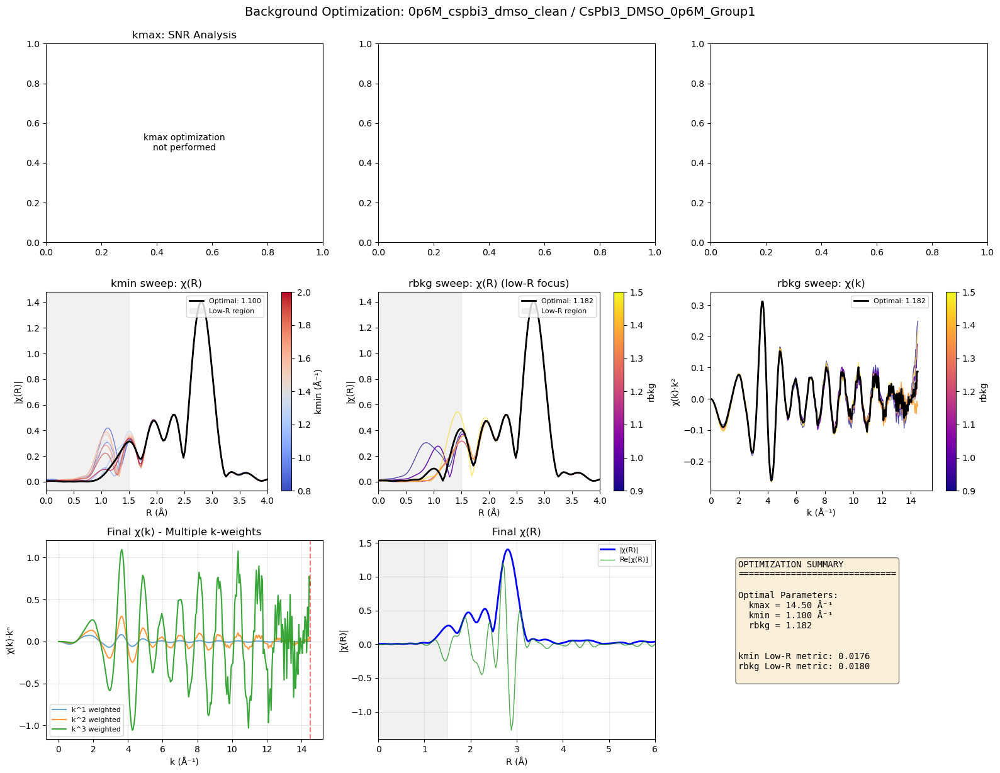


  Processing group: CsPbI3_DMSO_0p6M_Group2
  ----------------------------------------

  Fixed kmax = 14.50 Å⁻¹
  Starting alternating optimization...
  Initial: rbkg=1.000, kmin=1.00

  [Step 1/4] Optimizing rbkg...
    rbkg: 1.000 → 1.059

  [Step 2/4] Optimizing kmin...
    kmin: 1.000 → 1.100

  [Step 3/4] Optimizing rbkg...
    rbkg: 1.059 → 1.182 (Δ=0.1224)

  [Step 4/4] Optimizing kmin...
    kmin: 1.100 → 1.140 (Δ=0.0400)
  ⚠ Not fully converged (Δrbkg=0.1224, Δkmin=0.0400)

  Determining clamp values...
    clamp_hi = 30
    clamp_lo = 20

  Applying final parameters...

  ⚠ not converged for CsPbI3_DMSO_0p6M_Group2
    kmax = 14.50 Å⁻¹ (fixed)
    kmin = 1.140 Å⁻¹
    rbkg = 1.182
    steps = 4
    clamp_hi = 30, clamp_lo = 20


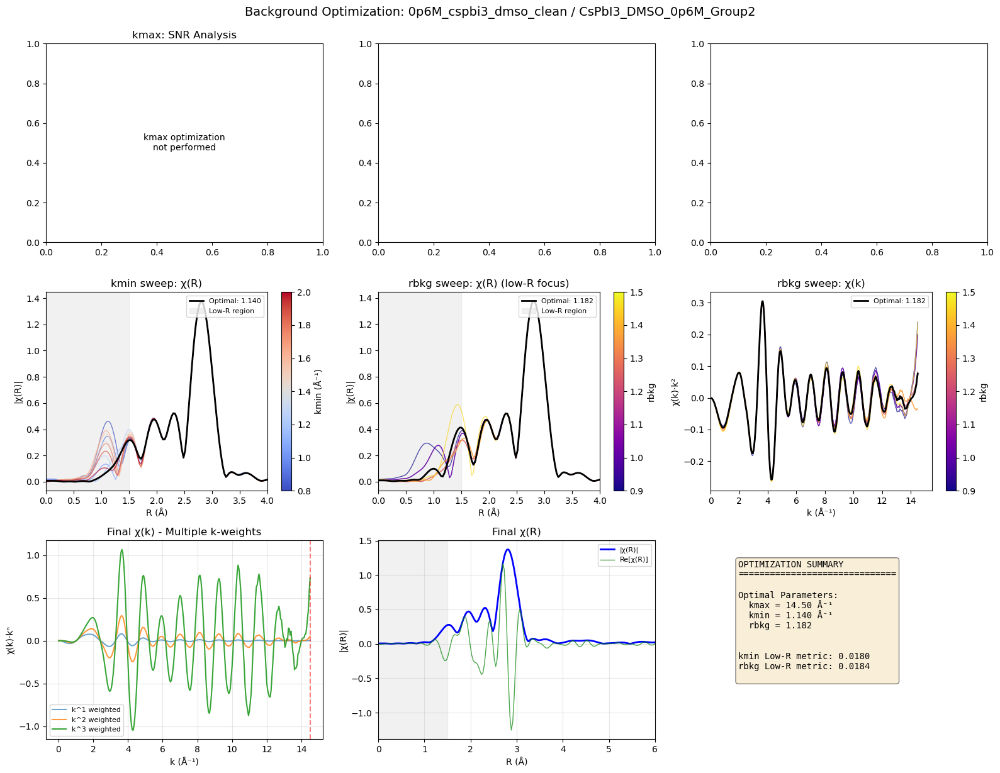


Processing Project: 0p7M_cspbi3_dmso_clean

  Processing group: CsPbI3_DMSO_0p7M_Group1_clean
  ----------------------------------------

  Fixed kmax = 14.50 Å⁻¹
  Starting alternating optimization...
  Initial: rbkg=1.000, kmin=1.00

  [Step 1/4] Optimizing rbkg...
    rbkg: 1.000 → 1.059

  [Step 2/4] Optimizing kmin...
    kmin: 1.000 → 1.140

  [Step 3/4] Optimizing rbkg...
    rbkg: 1.059 → 1.182 (Δ=0.1224)

  [Step 4/4] Optimizing kmin...
    kmin: 1.140 → 1.160 (Δ=0.0200)
  ⚠ Not fully converged (Δrbkg=0.1224, Δkmin=0.0200)

  Determining clamp values...
    clamp_hi = 40
    clamp_lo = 20

  Applying final parameters...

  ⚠ not converged for CsPbI3_DMSO_0p7M_Group1_clean
    kmax = 14.50 Å⁻¹ (fixed)
    kmin = 1.160 Å⁻¹
    rbkg = 1.182
    steps = 4
    clamp_hi = 40, clamp_lo = 20


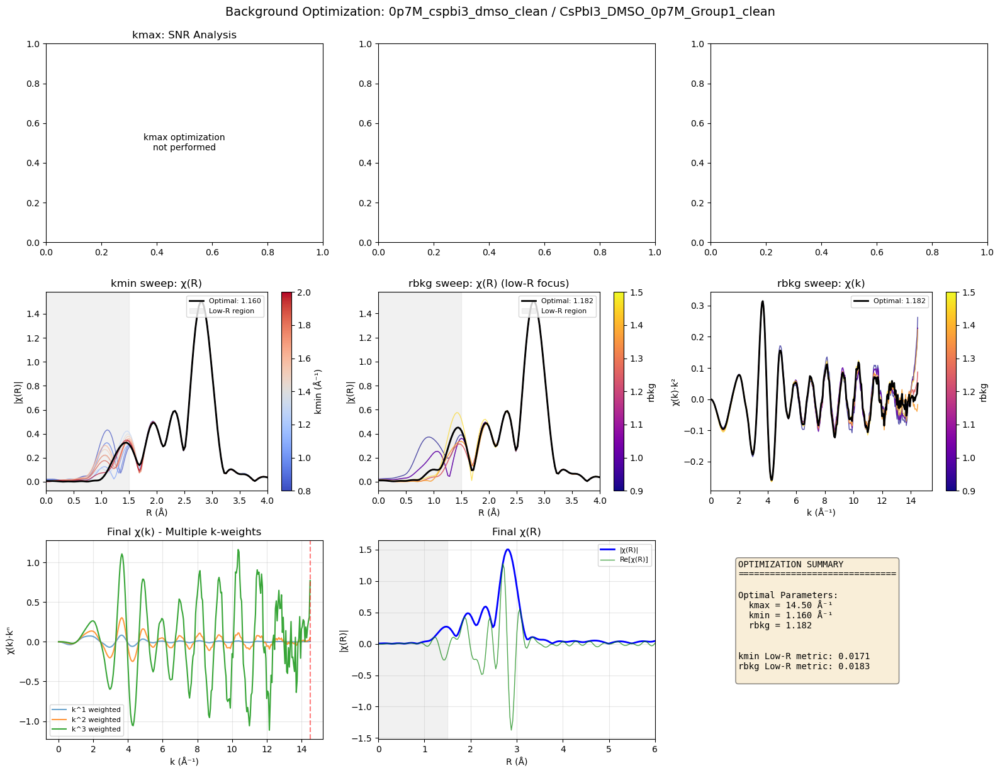


Processing Project: 0p8M_cspbi3_dmso_clean

  Processing group: CsPbI3_DMSO_0p8M_Group1
  ----------------------------------------

  Fixed kmax = 14.50 Å⁻¹
  Starting alternating optimization...
  Initial: rbkg=1.000, kmin=1.00

  [Step 1/4] Optimizing rbkg...
    rbkg: 1.000 → 1.059

  [Step 2/4] Optimizing kmin...
    kmin: 1.000 → 1.100

  [Step 3/4] Optimizing rbkg...
    rbkg: 1.059 → 1.059 (Δ=0.0000)

  [Step 4/4] Optimizing kmin...
    kmin: 1.100 → 1.100 (Δ=0.0000)
  ✓ CONVERGED (Δrbkg=0.0000 < 0.01, Δkmin=0.0000 < 0.02)

  Determining clamp values...
    clamp_hi = 40
    clamp_lo = 20

  Applying final parameters...

  ✓ CONVERGED for CsPbI3_DMSO_0p8M_Group1
    kmax = 14.50 Å⁻¹ (fixed)
    kmin = 1.100 Å⁻¹
    rbkg = 1.059
    steps = 4
    clamp_hi = 40, clamp_lo = 20


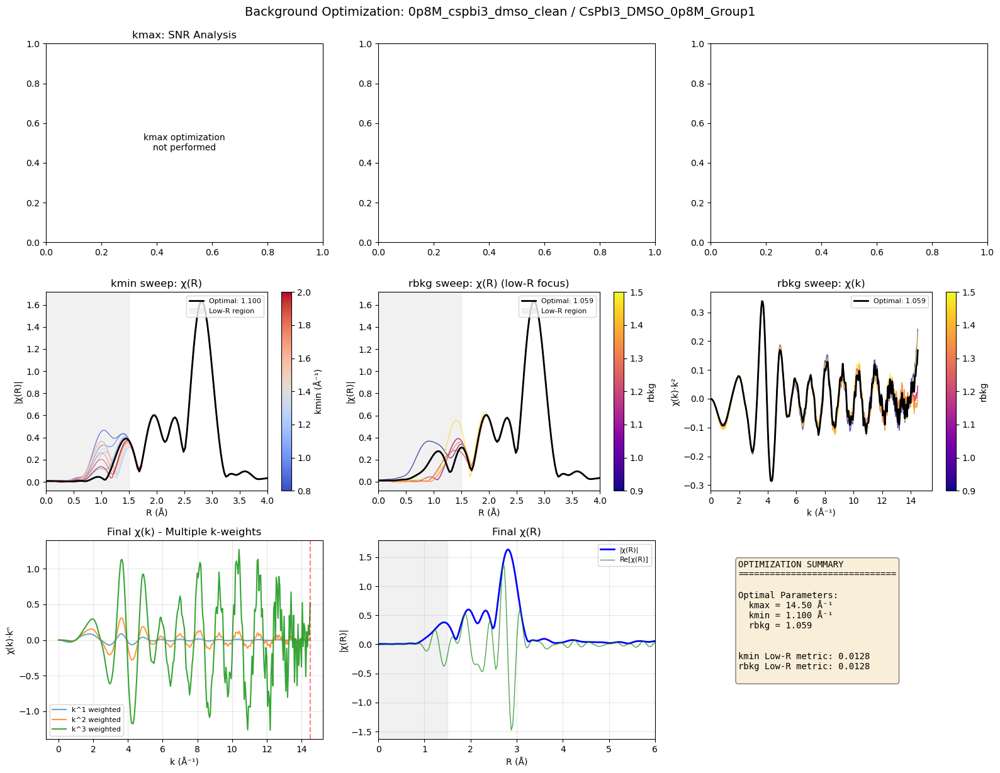


  Processing group: CsPbI3_DMSO_0p8M_Group2
  ----------------------------------------

  Fixed kmax = 14.50 Å⁻¹
  Starting alternating optimization...
  Initial: rbkg=1.000, kmin=1.00

  [Step 1/4] Optimizing rbkg...
    rbkg: 1.000 → 1.059

  [Step 2/4] Optimizing kmin...
    kmin: 1.000 → 1.120

  [Step 3/4] Optimizing rbkg...
    rbkg: 1.059 → 1.059 (Δ=0.0000)

  [Step 4/4] Optimizing kmin...
    kmin: 1.120 → 1.120 (Δ=0.0000)
  ✓ CONVERGED (Δrbkg=0.0000 < 0.01, Δkmin=0.0000 < 0.02)

  Determining clamp values...
    clamp_hi = 30
    clamp_lo = 20

  Applying final parameters...

  ✓ CONVERGED for CsPbI3_DMSO_0p8M_Group2
    kmax = 14.50 Å⁻¹ (fixed)
    kmin = 1.120 Å⁻¹
    rbkg = 1.059
    steps = 4
    clamp_hi = 30, clamp_lo = 20


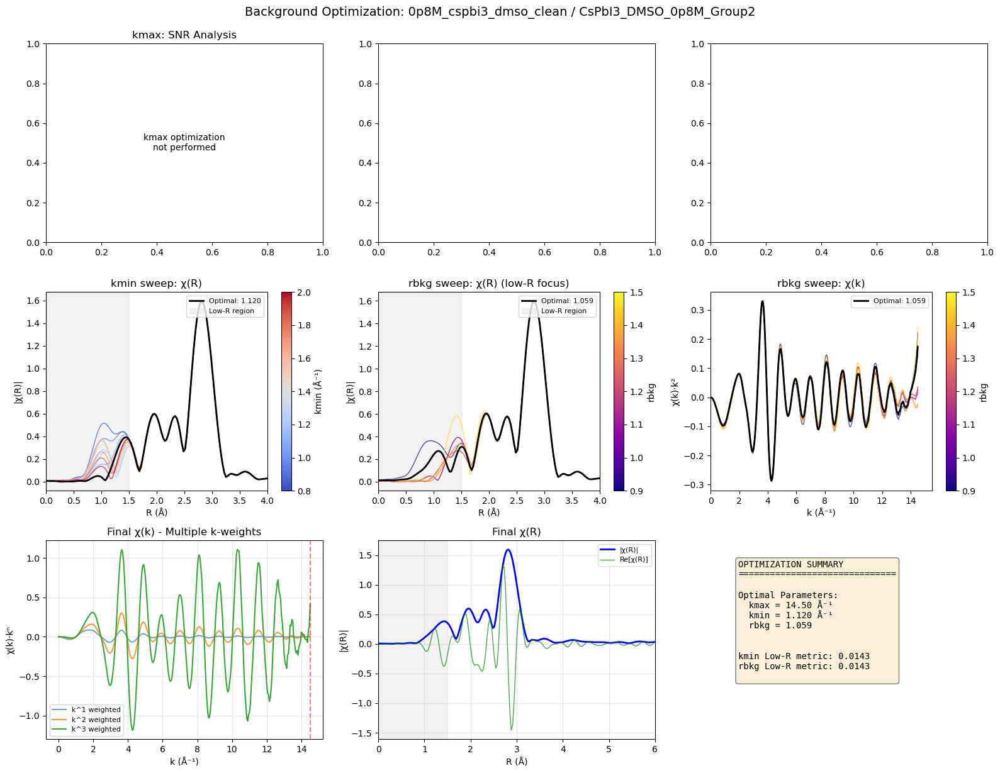


Processing Project: 0p9M_cspbi3_dmso_clean

  Processing group: CsPbI3_DMSO_0p9M_Group1
  ----------------------------------------

  Fixed kmax = 14.50 Å⁻¹
  Starting alternating optimization...
  Initial: rbkg=1.000, kmin=1.00

  [Step 1/4] Optimizing rbkg...
    rbkg: 1.000 → 1.059

  [Step 2/4] Optimizing kmin...
    kmin: 1.000 → 1.100

  [Step 3/4] Optimizing rbkg...
    rbkg: 1.059 → 1.182 (Δ=0.1224)

  [Step 4/4] Optimizing kmin...
    kmin: 1.100 → 1.100 (Δ=0.0000)
  ⚠ Not fully converged (Δrbkg=0.1224, Δkmin=0.0000)

  Determining clamp values...
    clamp_hi = 30
    clamp_lo = 20

  Applying final parameters...

  ⚠ not converged for CsPbI3_DMSO_0p9M_Group1
    kmax = 14.50 Å⁻¹ (fixed)
    kmin = 1.100 Å⁻¹
    rbkg = 1.182
    steps = 4
    clamp_hi = 30, clamp_lo = 20


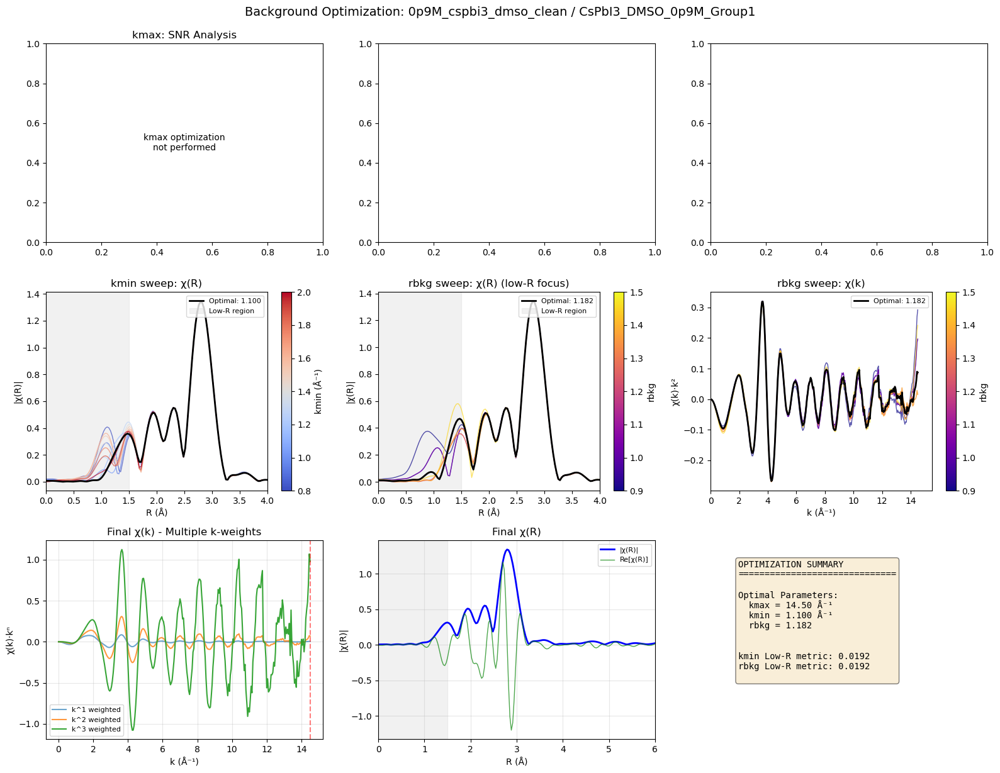


  Processing group: CsPbI3_DMSO_0p9M_Group2
  ----------------------------------------

  Fixed kmax = 14.50 Å⁻¹
  Starting alternating optimization...
  Initial: rbkg=1.000, kmin=1.00

  [Step 1/4] Optimizing rbkg...
    rbkg: 1.000 → 1.059

  [Step 2/4] Optimizing kmin...
    kmin: 1.000 → 1.100

  [Step 3/4] Optimizing rbkg...
    rbkg: 1.059 → 1.182 (Δ=0.1224)

  [Step 4/4] Optimizing kmin...
    kmin: 1.100 → 1.100 (Δ=0.0000)
  ⚠ Not fully converged (Δrbkg=0.1224, Δkmin=0.0000)

  Determining clamp values...
    clamp_hi = 30
    clamp_lo = 20

  Applying final parameters...

  ⚠ not converged for CsPbI3_DMSO_0p9M_Group2
    kmax = 14.50 Å⁻¹ (fixed)
    kmin = 1.100 Å⁻¹
    rbkg = 1.182
    steps = 4
    clamp_hi = 30, clamp_lo = 20


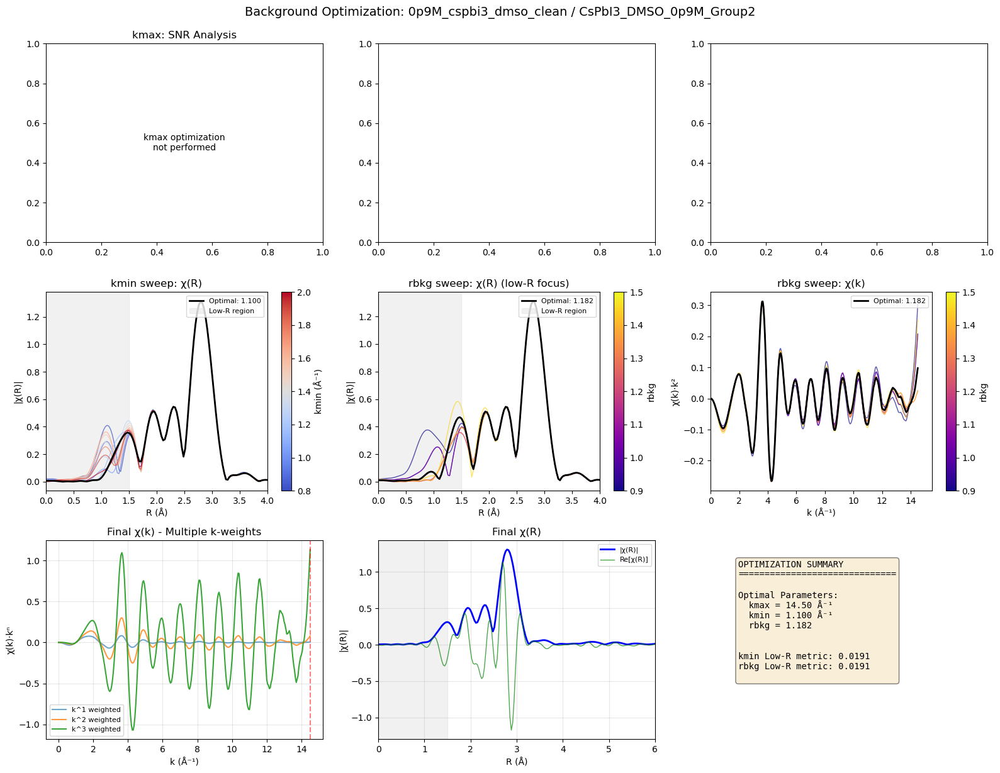


Processing Project: 1p0M_cspbi3_dmso_clean

  Processing group: CsPbI3_DMSO_1p0M_Group1
  ----------------------------------------

  Fixed kmax = 14.50 Å⁻¹
  Starting alternating optimization...
  Initial: rbkg=1.000, kmin=1.00

  [Step 1/4] Optimizing rbkg...
    rbkg: 1.000 → 1.059

  [Step 2/4] Optimizing kmin...
    kmin: 1.000 → 1.100

  [Step 3/4] Optimizing rbkg...
    rbkg: 1.059 → 1.059 (Δ=0.0000)

  [Step 4/4] Optimizing kmin...
    kmin: 1.100 → 1.100 (Δ=0.0000)
  ✓ CONVERGED (Δrbkg=0.0000 < 0.01, Δkmin=0.0000 < 0.02)

  Determining clamp values...
    clamp_hi = 40
    clamp_lo = 20

  Applying final parameters...

  ✓ CONVERGED for CsPbI3_DMSO_1p0M_Group1
    kmax = 14.50 Å⁻¹ (fixed)
    kmin = 1.100 Å⁻¹
    rbkg = 1.059
    steps = 4
    clamp_hi = 40, clamp_lo = 20


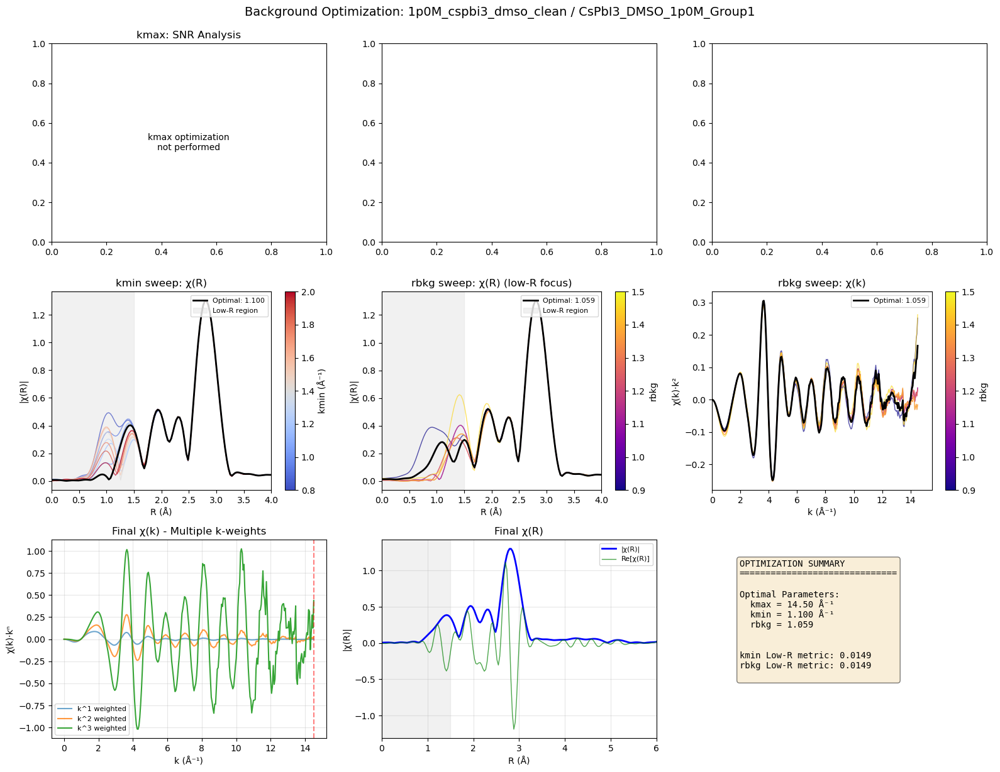


  Processing group: CsPbI3_DMSO_1p0M_Group2
  ----------------------------------------

  Fixed kmax = 14.50 Å⁻¹
  Starting alternating optimization...
  Initial: rbkg=1.000, kmin=1.00

  [Step 1/4] Optimizing rbkg...
    rbkg: 1.000 → 1.059

  [Step 2/4] Optimizing kmin...
    kmin: 1.000 → 1.120

  [Step 3/4] Optimizing rbkg...
    rbkg: 1.059 → 1.059 (Δ=0.0000)

  [Step 4/4] Optimizing kmin...
    kmin: 1.120 → 1.120 (Δ=0.0000)
  ✓ CONVERGED (Δrbkg=0.0000 < 0.01, Δkmin=0.0000 < 0.02)

  Determining clamp values...
    clamp_hi = 30
    clamp_lo = 20

  Applying final parameters...

  ✓ CONVERGED for CsPbI3_DMSO_1p0M_Group2
    kmax = 14.50 Å⁻¹ (fixed)
    kmin = 1.120 Å⁻¹
    rbkg = 1.059
    steps = 4
    clamp_hi = 30, clamp_lo = 20


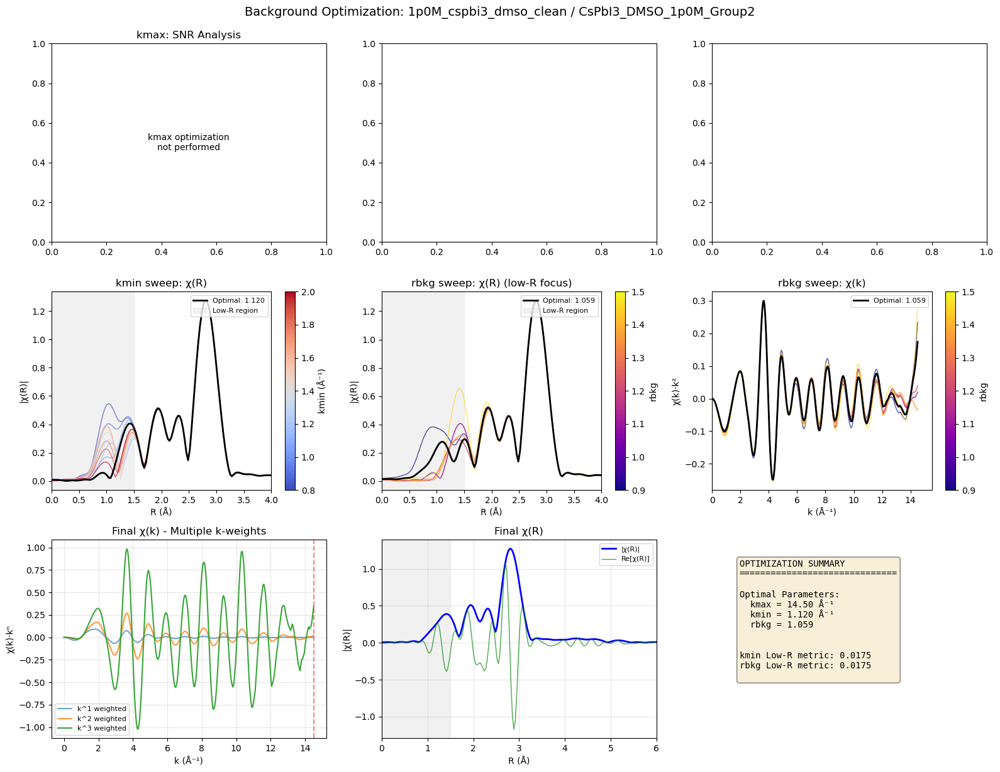


Processing Project: 1p2M_cspbi3_dmso_clean

  Processing group: CsPbI3_DMSO_1p2M_Group1
  ----------------------------------------

  Fixed kmax = 14.50 Å⁻¹
  Starting alternating optimization...
  Initial: rbkg=1.000, kmin=1.00

  [Step 1/4] Optimizing rbkg...
    rbkg: 1.000 → 1.059

  [Step 2/4] Optimizing kmin...
    kmin: 1.000 → 1.080

  [Step 3/4] Optimizing rbkg...
    rbkg: 1.059 → 1.059 (Δ=0.0000)

  [Step 4/4] Optimizing kmin...
    kmin: 1.080 → 1.080 (Δ=0.0000)
  ✓ CONVERGED (Δrbkg=0.0000 < 0.01, Δkmin=0.0000 < 0.02)

  Determining clamp values...
    clamp_hi = 40
    clamp_lo = 20

  Applying final parameters...

  ✓ CONVERGED for CsPbI3_DMSO_1p2M_Group1
    kmax = 14.50 Å⁻¹ (fixed)
    kmin = 1.080 Å⁻¹
    rbkg = 1.059
    steps = 4
    clamp_hi = 40, clamp_lo = 20


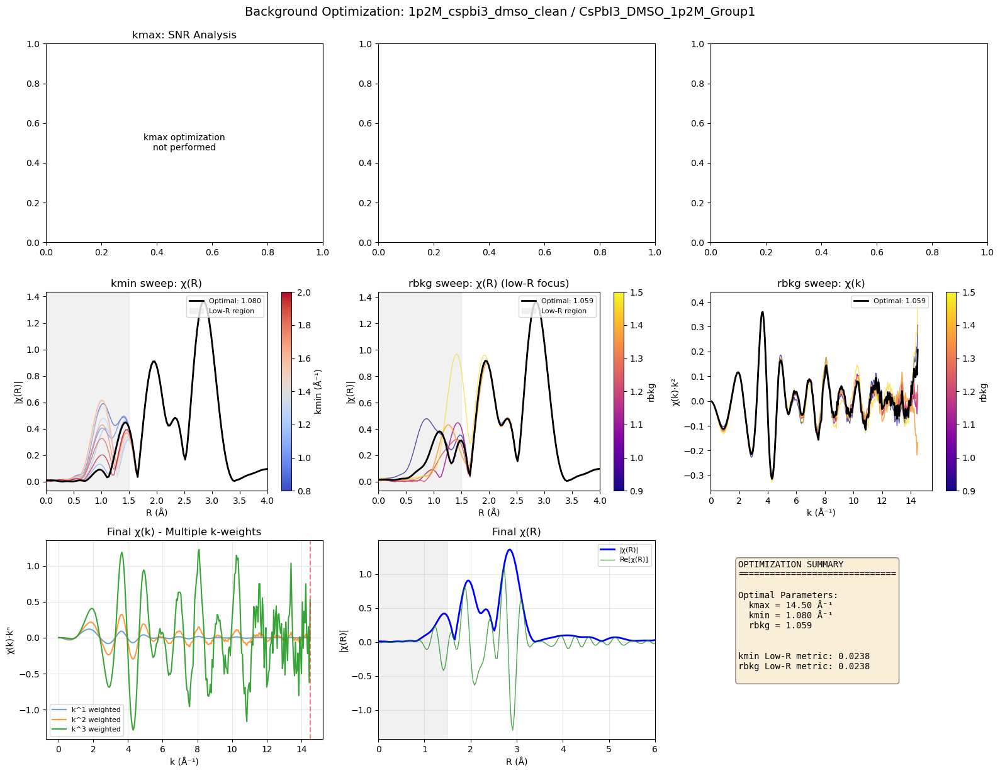


ALTERNATING RBKG/KMIN BACKGROUND_OPTIMIZER SUMMARY
  Optimization settings:
    fixed_kmax:     14.50 Å⁻¹
    kmin_range:     (0.8, 2.0)
    rbkg_range:     (0.9, 1.5)
    tol: rbkg=0.01, kmin=0.02

────────────────────────────────────────────────────────────────────────────────────────────────────
  GROUP: 0p1M_cspbi3_dmso_clean.CsPbI3_DMSO_0p1M_Group2_clean_1
────────────────────────────────────────────────────────────────────────────────────────────────────
  STATUS: ⚠ NOT CONVERGED in 4 steps

  DATA QUALITY:
    edge_step: 0.0057

  OPTIMAL PARAMETERS:
    kmax = 14.50 Å⁻¹ (fixed)  |  kmin = 1.160 Å⁻¹  |  rbkg = 1.182
    clamp_hi = 40  |  clamp_lo = 20

  OPTIMIZATION HISTORY:
    step     rbkg     kmin
       0    1.000    1.000
       1    1.059    1.000
       2    1.059    1.100
       3    1.182    1.100
       4    1.182    1.160

  FINAL METRICS:
    low-R artifact metric: 0.0286
    first-shell peak: amp = 1.581, pos = 2.79 Å

  BOUNDARY STATUS: ✓ Not at boundary

  SOLU

In [12]:
# cspbi3.background_optimizer()
cspbi3.background_optimizer(fixed_kmax=14.5, kmin_range=(0.8, 2.0), rbkg_range=(0.9, 1.5))


Processing FT for '0p1M_cspbi3_dmso_clean.CsPbI3_DMSO_0p1M_Group2_clean_1'
  kmax range: [11.5, 14.5] Å⁻¹
  Total weighted zero crossings found: 40
  Eligible kmin zero crossings in [1.5, 3.0]: 1
  kmin candidates: [2.45]
  Eligible kmax zero crossings in [11.5, 14.50]: 22
  kmax candidates (zero crossings): [11.85 11.9  11.95 12.5  13.1  13.25 13.3  13.35 13.45 13.5  13.55 13.75
 13.8  13.85 13.95 14.   14.05 14.1  14.2  14.25 14.3  14.35]
  Candidate combinations to test: 22
  kmax candidates: 22 values in [11.85, 14.35] Å⁻¹
  Best: kmin=2.45, kmax=11.95, score=48.815600
        first_shell_area=0.176078, highR_area=0.003607, peak=0.214014, SNR=41.096
        selected zero-crossing indices: kmin #1, kmax #3


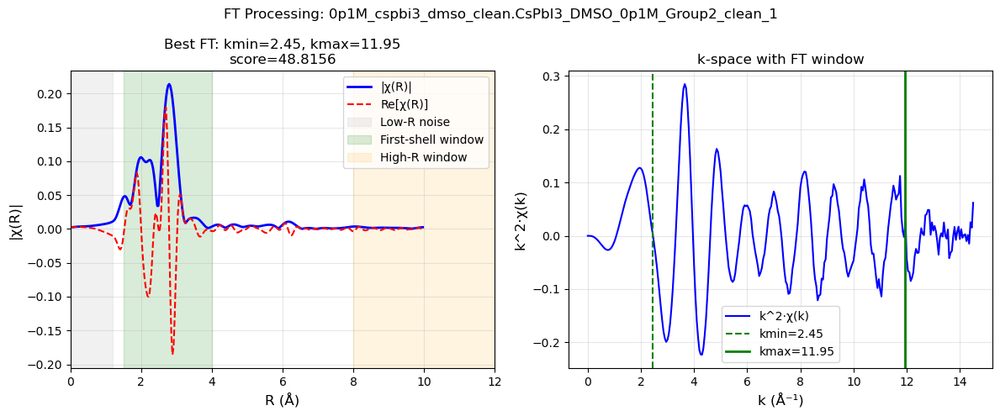


Processing FT for '0p1M_cspbi3_dmso_clean.CsPbI3_DMSO_0p1M_Group1_clean_smooth'
  kmax range: [11.5, 14.5] Å⁻¹
  Total weighted zero crossings found: 24
  Eligible kmin zero crossings in [1.5, 3.0]: 1
  kmin candidates: [2.45]
  Eligible kmax zero crossings in [11.5, 14.50]: 6
  kmax candidates (zero crossings): [11.85 12.45 13.   13.25 13.6  14.2 ]
  Candidate combinations to test: 6
  kmax candidates: 6 values in [11.85, 14.20] Å⁻¹
  Best: kmin=2.45, kmax=11.85, score=270.777792
        first_shell_area=0.189568, highR_area=0.000700, peak=0.217975, SNR=29.810
        selected zero-crossing indices: kmin #1, kmax #1


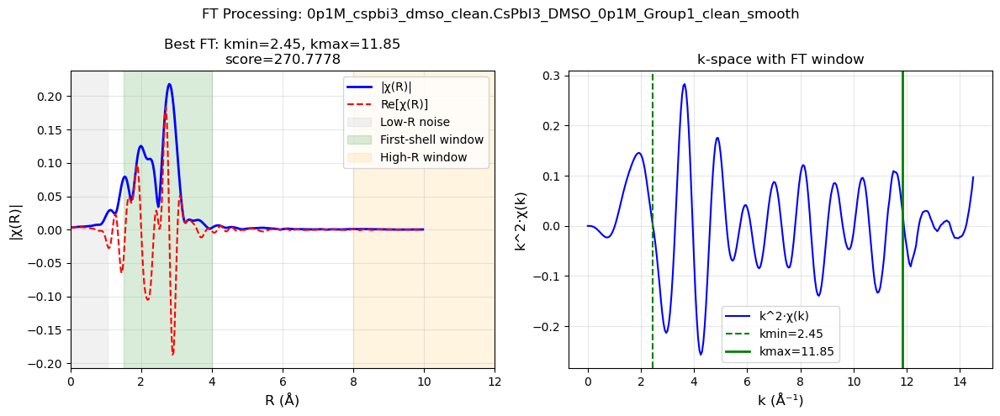


Processing FT for '0p1M_cspbi3_dmso_clean.CsPbI3_DMSO_0p1m_Group3_clean_deconv'
  kmax range: [11.5, 14.5] Å⁻¹
  Total weighted zero crossings found: 32
  Eligible kmin zero crossings in [1.5, 3.0]: 1
  kmin candidates: [2.35]
  Eligible kmax zero crossings in [11.5, 14.50]: 14
  kmax candidates (zero crossings): [11.8  11.9  11.95 12.4  13.   13.25 13.45 13.5  13.55 13.7  13.85 14.
 14.05 14.35]
  Candidate combinations to test: 14
  kmax candidates: 14 values in [11.80, 14.35] Å⁻¹
  Best: kmin=2.35, kmax=11.95, score=68.179242
        first_shell_area=0.213787, highR_area=0.003136, peak=0.245951, SNR=57.024
        selected zero-crossing indices: kmin #1, kmax #3


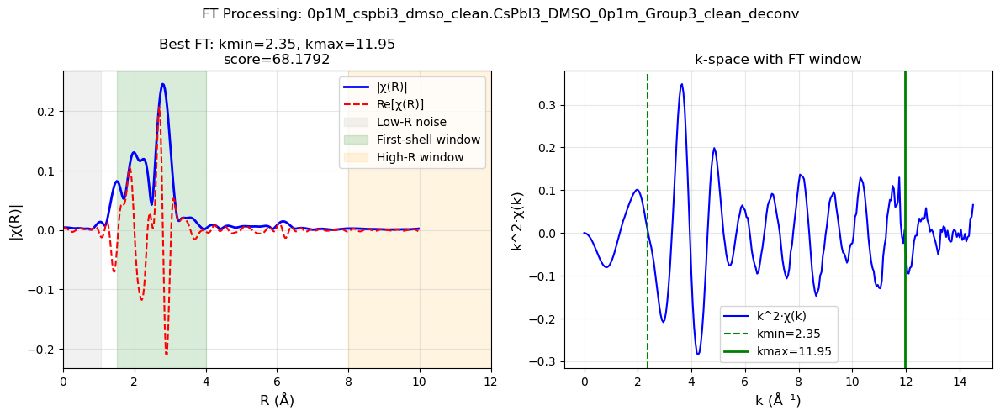


Processing FT for '0p2M_cspbi3_dmso_clean.CsPbI3_DMSO_0p2M_Group1_clean'
  kmax range: [11.5, 14.5] Å⁻¹
  Total weighted zero crossings found: 32
  Eligible kmin zero crossings in [1.5, 3.0]: 1
  kmin candidates: [2.4]
  Eligible kmax zero crossings in [11.5, 14.50]: 14
  kmax candidates (zero crossings): [11.75 12.3  12.8  12.85 12.9  13.25 13.3  13.4  13.45 13.65 14.05 14.15
 14.2  14.35]
  Candidate combinations to test: 14
  kmax candidates: 14 values in [11.75, 14.35] Å⁻¹
  Best: kmin=2.40, kmax=11.75, score=61.825065
        first_shell_area=0.218668, highR_area=0.003537, peak=0.248176, SNR=28.746
        selected zero-crossing indices: kmin #1, kmax #1


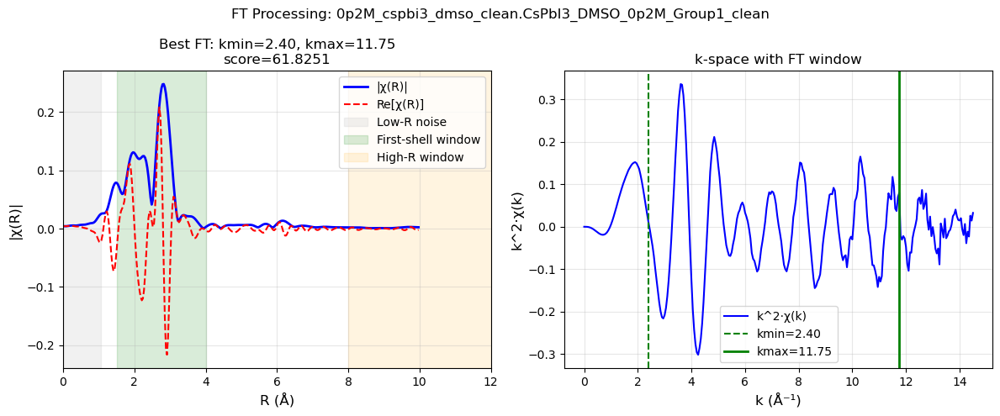


Processing FT for '0p2M_cspbi3_dmso_clean.CsPbI3_DMSO_0p2M_Group2'
  kmax range: [11.5, 14.5] Å⁻¹
  Total weighted zero crossings found: 24
  Eligible kmin zero crossings in [1.5, 3.0]: 1
  kmin candidates: [2.45]
  Eligible kmax zero crossings in [11.5, 14.50]: 6
  kmax candidates (zero crossings): [11.8  12.3  12.9  13.6  14.05 14.35]
  Candidate combinations to test: 6
  kmax candidates: 6 values in [11.80, 14.35] Å⁻¹
  Best: kmin=2.45, kmax=11.80, score=505.174101
        first_shell_area=0.214331, highR_area=0.000424, peak=0.243257, SNR=26.612
        selected zero-crossing indices: kmin #1, kmax #1


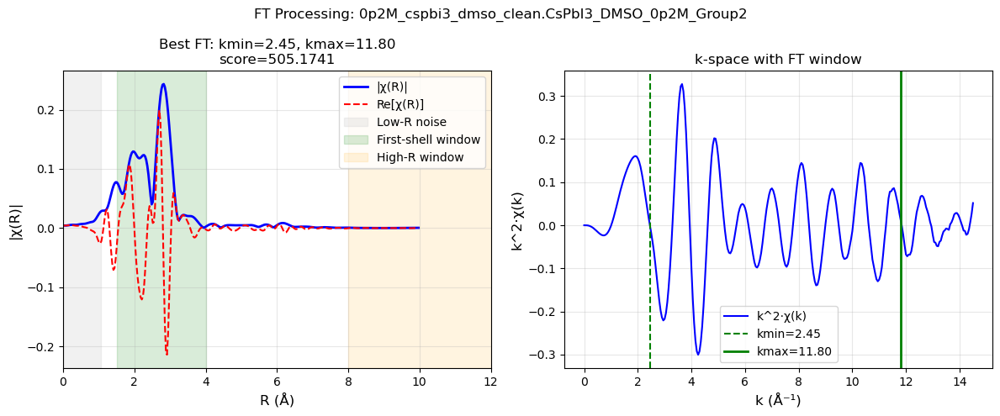


Processing FT for '0p3M_cspbi3_dmso_clean.CsPbI3_DMSO_0p3M_Group1'
  kmax range: [11.5, 14.5] Å⁻¹
  Total weighted zero crossings found: 30
  Eligible kmin zero crossings in [1.5, 3.0]: 1
  kmin candidates: [2.4]
  Eligible kmax zero crossings in [11.5, 14.50]: 12
  kmax candidates (zero crossings): [11.85 12.4  12.9  13.3  13.5  13.55 13.6  13.75 14.05 14.1  14.2  14.4 ]
  Candidate combinations to test: 12
  kmax candidates: 12 values in [11.85, 14.40] Å⁻¹
  Best: kmin=2.40, kmax=11.85, score=54.143697
        first_shell_area=0.209135, highR_area=0.003863, peak=0.238480, SNR=28.135
        selected zero-crossing indices: kmin #1, kmax #1


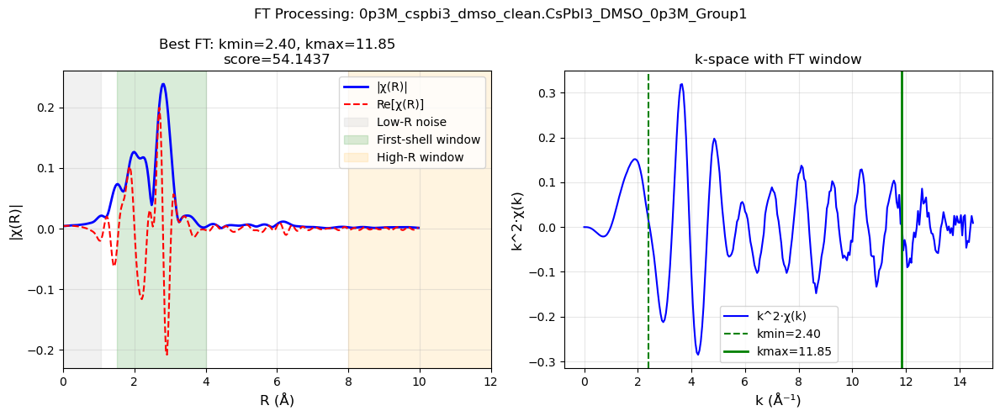


Processing FT for '0p4M_cspbi3_dmso_clean.CsPbI3_DMSO_0p4M_Group1'
  kmax range: [11.5, 14.5] Å⁻¹
  Total weighted zero crossings found: 35
  Eligible kmin zero crossings in [1.5, 3.0]: 1
  kmin candidates: [2.45]
  Eligible kmax zero crossings in [11.5, 14.50]: 17
  kmax candidates (zero crossings): [11.8  12.3  12.4  12.45 13.   13.05 13.1  13.3  13.35 13.45 13.5  13.7
 13.9  13.95 14.15 14.2  14.25]
  Candidate combinations to test: 17
  kmax candidates: 17 values in [11.80, 14.25] Å⁻¹
  Best: kmin=2.45, kmax=11.80, score=54.157423
        first_shell_area=0.196773, highR_area=0.003633, peak=0.229719, SNR=26.113
        selected zero-crossing indices: kmin #1, kmax #1


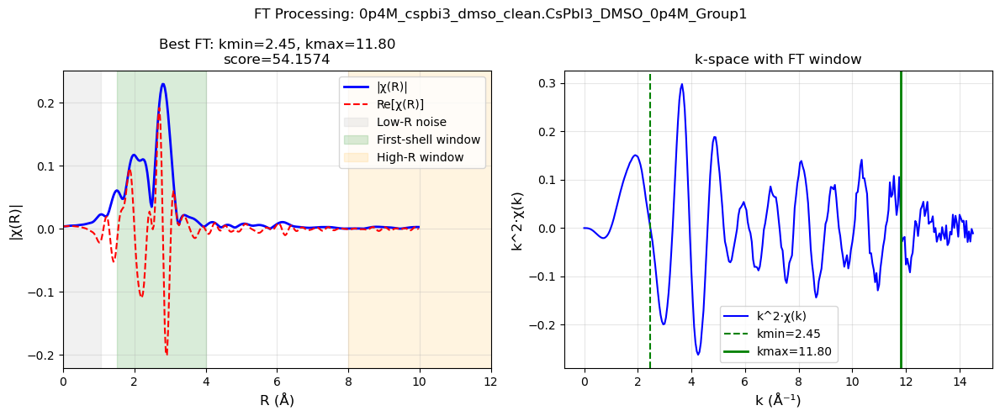


Processing FT for '0p4M_cspbi3_dmso_clean.CsPbI3_DMSO_0p4M_Group2'
  kmax range: [11.5, 14.5] Å⁻¹
  Total weighted zero crossings found: 23
  Eligible kmin zero crossings in [1.5, 3.0]: 1
  kmin candidates: [2.45]
  Eligible kmax zero crossings in [11.5, 14.50]: 5
  kmax candidates (zero crossings): [11.85 12.35 13.   13.75 14.2 ]
  Candidate combinations to test: 5
  kmax candidates: 5 values in [11.85, 14.20] Å⁻¹
  Best: kmin=2.45, kmax=11.85, score=584.720510
        first_shell_area=0.193561, highR_area=0.000331, peak=0.224972, SNR=24.289
        selected zero-crossing indices: kmin #1, kmax #1


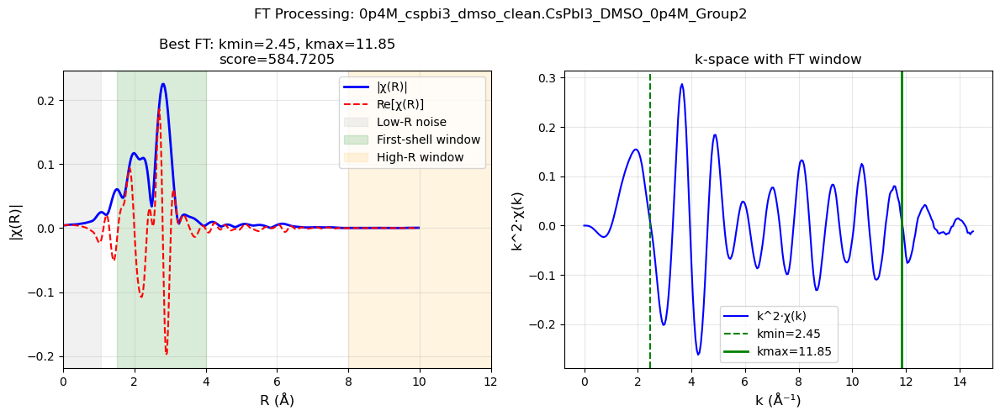


Processing FT for '0p5M_cspbi3_dmso_clean.CsPbI3_DMSO_0p5M_Group1'
  kmax range: [11.5, 14.5] Å⁻¹
  Total weighted zero crossings found: 36
  Eligible kmin zero crossings in [1.5, 3.0]: 1
  kmin candidates: [2.4]
  Eligible kmax zero crossings in [11.5, 14.50]: 18
  kmax candidates (zero crossings): [11.75 12.3  12.95 13.3  13.35 13.4  13.5  13.55 13.6  13.7  13.75 13.8
 14.   14.05 14.1  14.3  14.35 14.4 ]
  Candidate combinations to test: 18
  kmax candidates: 18 values in [11.75, 14.40] Å⁻¹
  Best: kmin=2.40, kmax=11.75, score=137.178508
        first_shell_area=0.212723, highR_area=0.001551, peak=0.240598, SNR=25.751
        selected zero-crossing indices: kmin #1, kmax #1


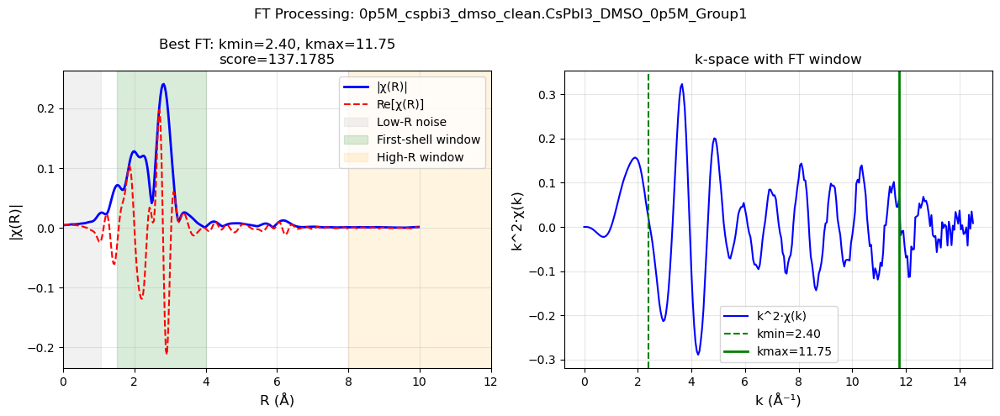


Processing FT for '0p5M_cspbi3_dmso_clean.CsPbI3_DMSO_0p5M_Group2'
  kmax range: [11.5, 14.5] Å⁻¹
  Total weighted zero crossings found: 24
  Eligible kmin zero crossings in [1.5, 3.0]: 1
  kmin candidates: [2.45]
  Eligible kmax zero crossings in [11.5, 14.50]: 6
  kmax candidates (zero crossings): [11.8  12.35 12.95 13.75 14.05 14.35]
  Candidate combinations to test: 6
  kmax candidates: 6 values in [11.80, 14.35] Å⁻¹
  Best: kmin=2.45, kmax=11.80, score=956.384073
        first_shell_area=0.206692, highR_area=0.000216, peak=0.234641, SNR=26.728
        selected zero-crossing indices: kmin #1, kmax #1


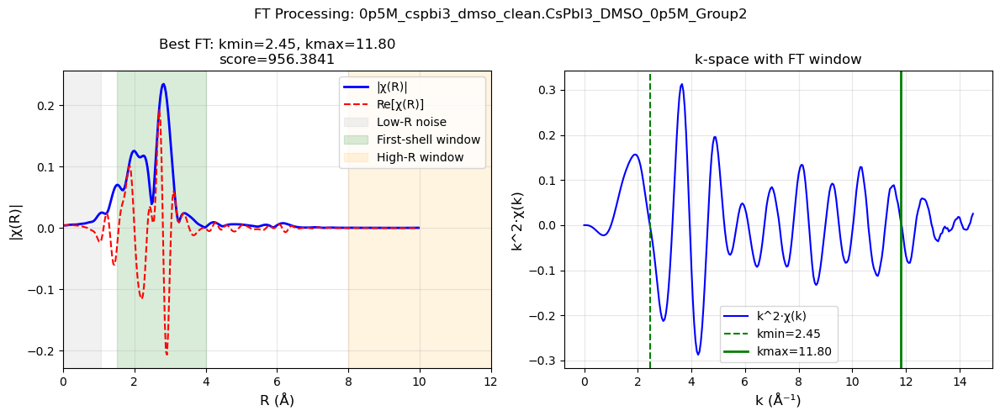


Processing FT for '0p6M_cspbi3_dmso_clean.CsPbI3_DMSO_0p6M_Group1'
  kmax range: [11.5, 14.5] Å⁻¹
  Total weighted zero crossings found: 42
  Eligible kmin zero crossings in [1.5, 3.0]: 1
  kmin candidates: [2.35]
  Eligible kmax zero crossings in [11.5, 14.50]: 24
  kmax candidates (zero crossings): [11.75 12.4  12.8  12.85 12.95 13.   13.1  13.15 13.2  13.25 13.35 13.4
 13.45 13.55 13.6  13.8  13.85 13.9  13.95 14.05 14.1  14.15 14.25 14.3 ]
  Candidate combinations to test: 24
  kmax candidates: 24 values in [11.75, 14.30] Å⁻¹
  Best: kmin=2.35, kmax=11.75, score=76.951216
        first_shell_area=0.183454, highR_area=0.002384, peak=0.195830, SNR=33.763
        selected zero-crossing indices: kmin #1, kmax #1


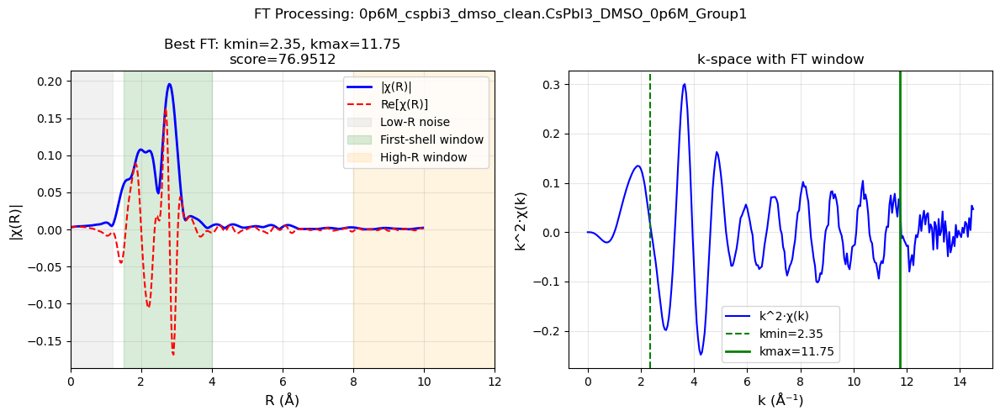


Processing FT for '0p6M_cspbi3_dmso_clean.CsPbI3_DMSO_0p6M_Group2'
  kmax range: [11.5, 14.5] Å⁻¹
  Total weighted zero crossings found: 24
  Eligible kmin zero crossings in [1.5, 3.0]: 1
  kmin candidates: [2.4]
  Eligible kmax zero crossings in [11.5, 14.50]: 6
  kmax candidates (zero crossings): [11.85 12.4  13.   13.1  13.4  14.  ]
  Candidate combinations to test: 6
  kmax candidates: 6 values in [11.85, 14.00] Å⁻¹
  Best: kmin=2.40, kmax=11.85, score=604.038115
        first_shell_area=0.178454, highR_area=0.000295, peak=0.191432, SNR=32.111
        selected zero-crossing indices: kmin #1, kmax #1


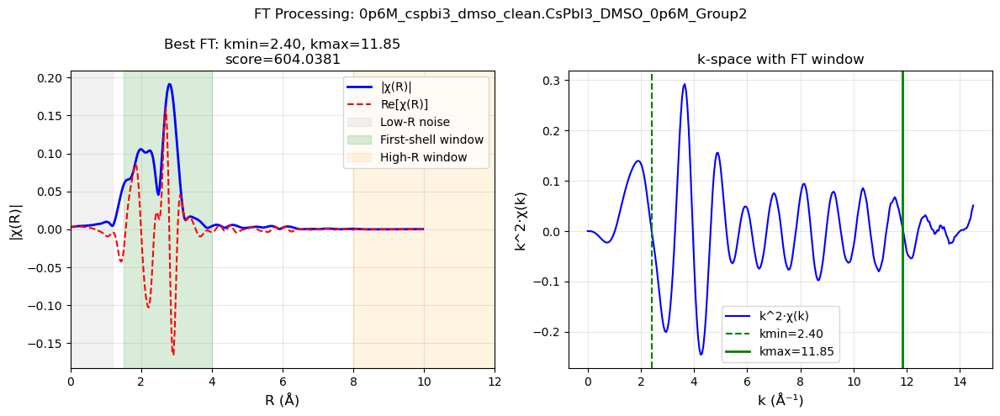


Processing FT for '0p7M_cspbi3_dmso_clean.CsPbI3_DMSO_0p7M_Group1_clean'
  kmax range: [11.5, 14.5] Å⁻¹
  Total weighted zero crossings found: 32
  Eligible kmin zero crossings in [1.5, 3.0]: 1
  kmin candidates: [2.4]
  Eligible kmax zero crossings in [11.5, 14.50]: 14
  kmax candidates (zero crossings): [11.75 12.3  12.4  12.45 12.95 13.05 13.1  13.35 13.4  13.6  13.65 13.8
 13.9  13.95]
  Candidate combinations to test: 14
  kmax candidates: 14 values in [11.75, 13.95] Å⁻¹
  Best: kmin=2.40, kmax=11.75, score=54.412971
        first_shell_area=0.184459, highR_area=0.003390, peak=0.203566, SNR=33.977
        selected zero-crossing indices: kmin #1, kmax #1


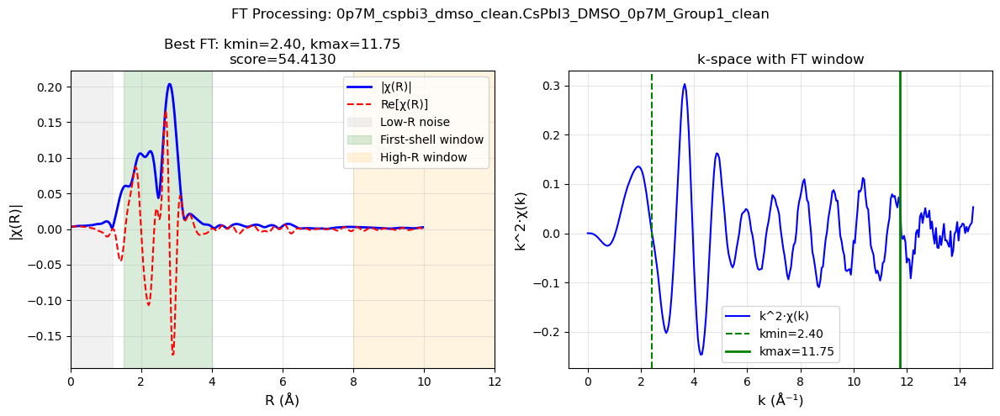


Processing FT for '0p8M_cspbi3_dmso_clean.CsPbI3_DMSO_0p8M_Group1'
  kmax range: [11.5, 14.5] Å⁻¹
  Total weighted zero crossings found: 40
  Eligible kmin zero crossings in [1.5, 3.0]: 1
  kmin candidates: [2.4]
  Eligible kmax zero crossings in [11.5, 14.50]: 22
  kmax candidates (zero crossings): [11.75 12.35 12.9  12.95 13.   13.25 13.45 13.5  13.55 13.6  13.65 13.75
 13.8  13.9  13.95 14.   14.05 14.1  14.2  14.25 14.3  14.35]
  Candidate combinations to test: 22
  kmax candidates: 22 values in [11.75, 14.35] Å⁻¹
  Best: kmin=2.40, kmax=11.75, score=55.421150
        first_shell_area=0.201710, highR_area=0.003640, peak=0.221246, SNR=24.890
        selected zero-crossing indices: kmin #1, kmax #1


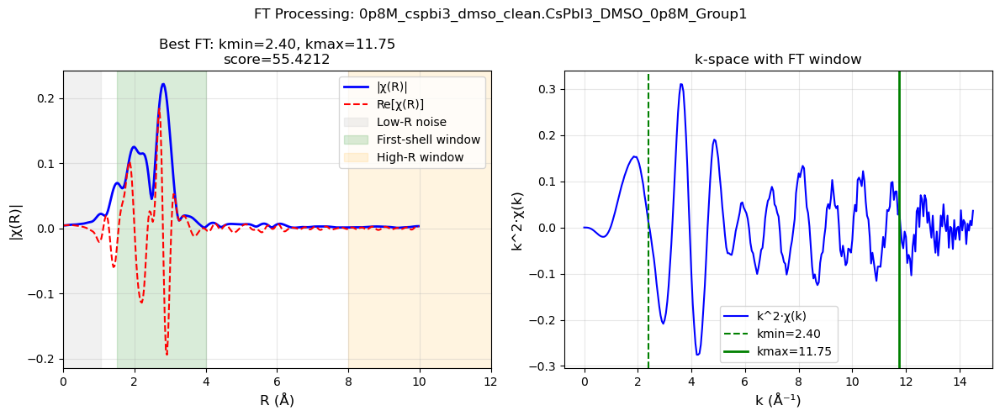


Processing FT for '0p8M_cspbi3_dmso_clean.CsPbI3_DMSO_0p8M_Group2'
  kmax range: [11.5, 14.5] Å⁻¹
  Total weighted zero crossings found: 26
  Eligible kmin zero crossings in [1.5, 3.0]: 1
  kmin candidates: [2.4]
  Eligible kmax zero crossings in [11.5, 14.50]: 8
  kmax candidates (zero crossings): [11.8  12.35 12.95 13.3  13.55 13.95 14.15 14.35]
  Candidate combinations to test: 8
  kmax candidates: 8 values in [11.80, 14.35] Å⁻¹
  Best: kmin=2.40, kmax=11.80, score=518.495416
        first_shell_area=0.198550, highR_area=0.000383, peak=0.216862, SNR=22.186
        selected zero-crossing indices: kmin #1, kmax #1


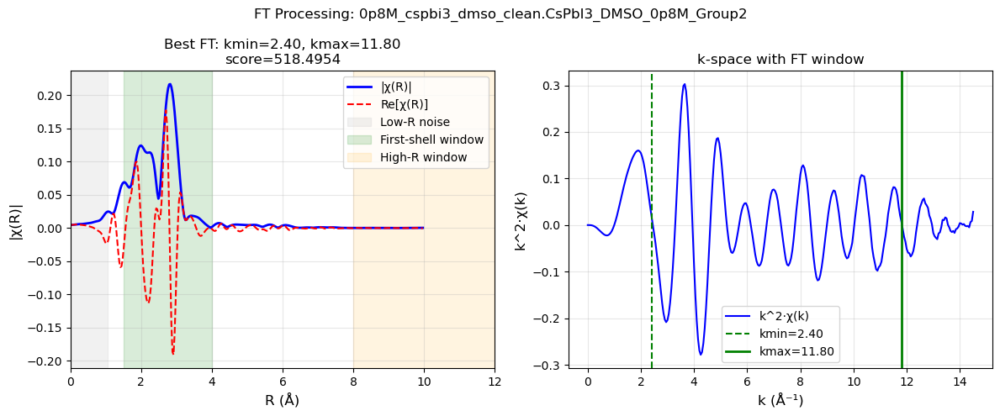


Processing FT for '0p9M_cspbi3_dmso_clean.CsPbI3_DMSO_0p9M_Group1'
  kmax range: [11.5, 14.5] Å⁻¹
  Total weighted zero crossings found: 30
  Eligible kmin zero crossings in [1.5, 3.0]: 1
  kmin candidates: [2.35]
  Eligible kmax zero crossings in [11.5, 14.50]: 10
  kmax candidates (zero crossings): [11.8  12.5  13.3  13.35 13.4  13.95 14.   14.05 14.1  14.2 ]
  Candidate combinations to test: 10
  kmax candidates: 10 values in [11.80, 14.20] Å⁻¹
  Best: kmin=2.35, kmax=11.80, score=49.691729
        first_shell_area=0.184474, highR_area=0.003712, peak=0.191275, SNR=31.897
        selected zero-crossing indices: kmin #1, kmax #1


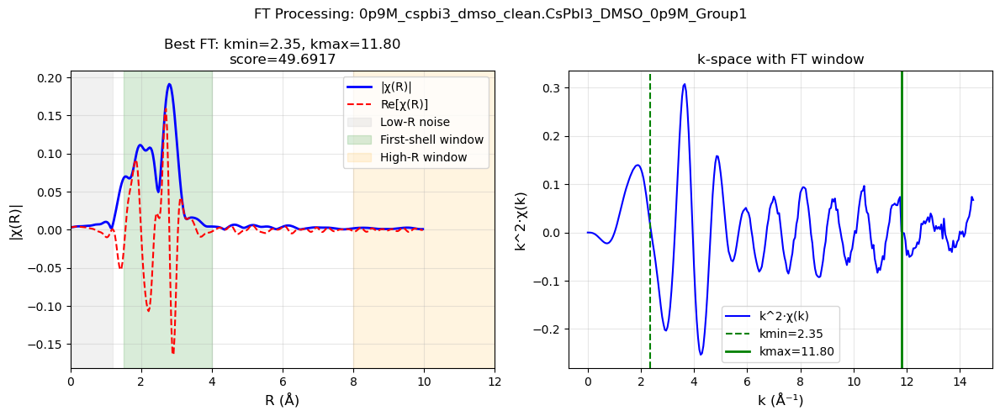


Processing FT for '0p9M_cspbi3_dmso_clean.CsPbI3_DMSO_0p9M_Group2'
  kmax range: [11.5, 14.5] Å⁻¹
  Total weighted zero crossings found: 22
  Eligible kmin zero crossings in [1.5, 3.0]: 1
  kmin candidates: [2.35]
  Eligible kmax zero crossings in [11.5, 14.50]: 4
  kmax candidates (zero crossings): [11.85 12.5  13.4  14.1 ]
  Candidate combinations to test: 4
  kmax candidates: 4 values in [11.85, 14.10] Å⁻¹
  Best: kmin=2.35, kmax=11.85, score=434.967637
        first_shell_area=0.180892, highR_area=0.000416, peak=0.186962, SNR=31.245
        selected zero-crossing indices: kmin #1, kmax #1


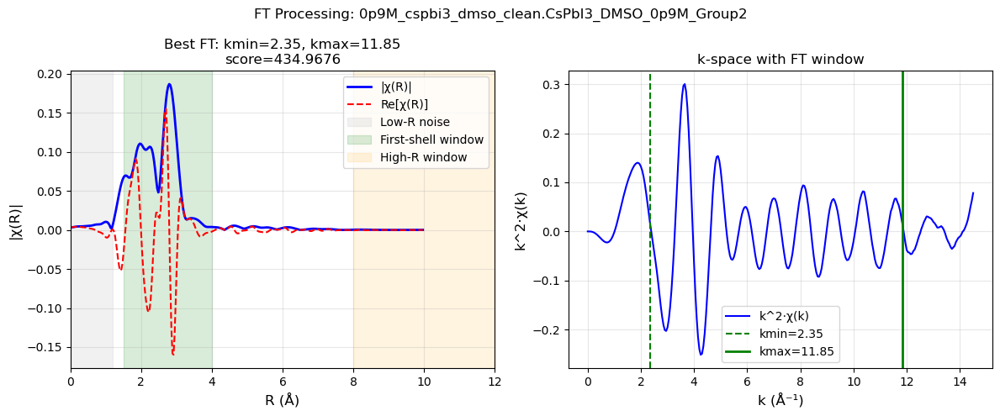


Processing FT for '1p0M_cspbi3_dmso_clean.CsPbI3_DMSO_1p0M_Group1'
  kmax range: [11.5, 14.5] Å⁻¹
  Total weighted zero crossings found: 28
  Eligible kmin zero crossings in [1.5, 3.0]: 1
  kmin candidates: [2.4]
  Eligible kmax zero crossings in [11.5, 14.50]: 10
  kmax candidates (zero crossings): [11.85 12.4  12.45 12.5  13.2  13.25 13.45 14.   14.25 14.3 ]
  Candidate combinations to test: 10
  kmax candidates: 10 values in [11.85, 14.30] Å⁻¹
  Best: kmin=2.40, kmax=11.85, score=102.016540
        first_shell_area=0.173951, highR_area=0.001705, peak=0.183436, SNR=19.698
        selected zero-crossing indices: kmin #1, kmax #1


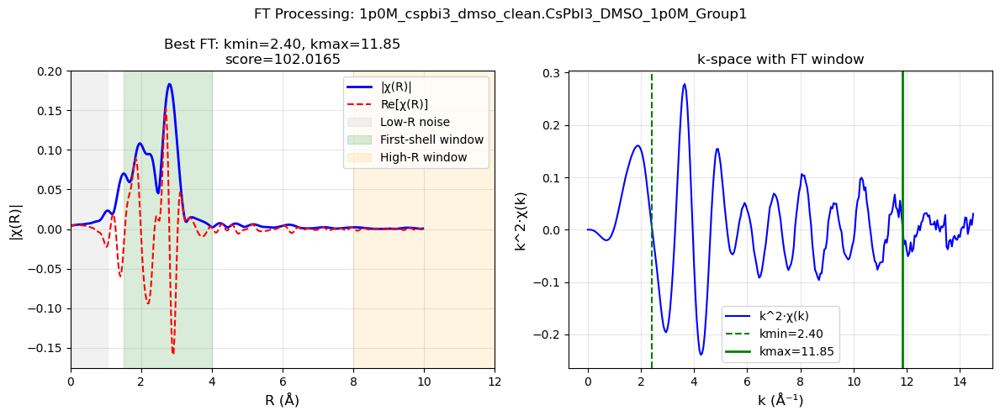


Processing FT for '1p0M_cspbi3_dmso_clean.CsPbI3_DMSO_1p0M_Group2'
  kmax range: [11.5, 14.5] Å⁻¹
  Total weighted zero crossings found: 22
  Eligible kmin zero crossings in [1.5, 3.0]: 1
  kmin candidates: [2.4]
  Eligible kmax zero crossings in [11.5, 14.50]: 4
  kmax candidates (zero crossings): [11.85 12.45 13.4  14.05]
  Candidate combinations to test: 4
  kmax candidates: 4 values in [11.85, 14.05] Å⁻¹
  Best: kmin=2.40, kmax=11.85, score=662.811040
        first_shell_area=0.171716, highR_area=0.000259, peak=0.179295, SNR=17.514
        selected zero-crossing indices: kmin #1, kmax #1


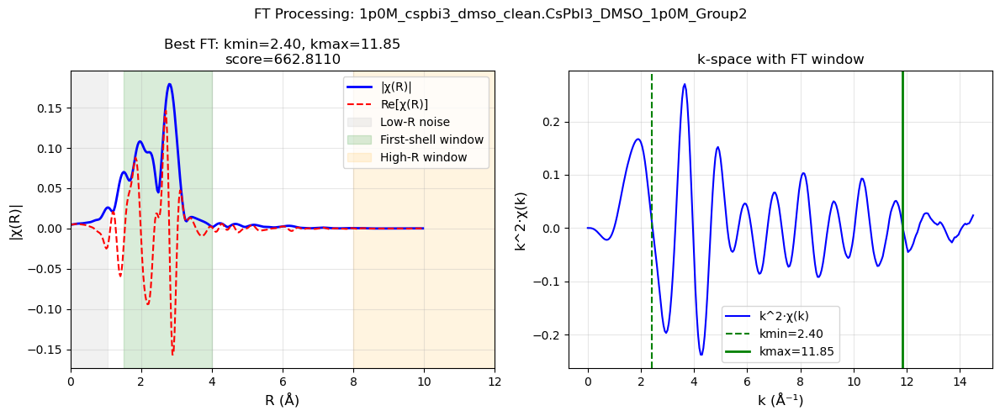


Processing FT for '1p2M_cspbi3_dmso_clean.CsPbI3_DMSO_1p2M_Group1'
  kmax range: [11.5, 14.5] Å⁻¹
  Total weighted zero crossings found: 42
  Eligible kmin zero crossings in [1.5, 3.0]: 1
  kmin candidates: [2.35]
  Eligible kmax zero crossings in [11.5, 14.50]: 24
  kmax candidates (zero crossings): [11.8  11.9  11.95 12.25 12.3  12.35 12.55 12.6  12.85 12.95 13.   13.05
 13.1  13.2  13.45 13.85 13.9  14.   14.05 14.1  14.3  14.35 14.4  14.45]
  Candidate combinations to test: 24
  kmax candidates: 24 values in [11.80, 14.45] Å⁻¹
  Best: kmin=2.35, kmax=11.95, score=82.325012
        first_shell_area=0.214776, highR_area=0.002609, peak=0.194212, SNR=17.540
        selected zero-crossing indices: kmin #1, kmax #3


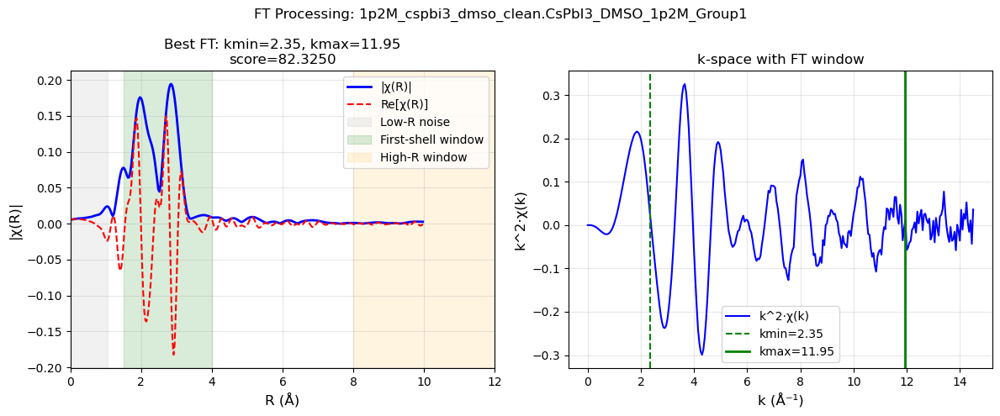


FT_PROCESSING_BATCH SUMMARY

  PARAMETERS:
    kmax_range: (11.5, 14.5)
    kmin_zc_range: (1.5, 3.0)
    kmax_zc_range: (11.5, 14.5)
    kweight: 2
    dk: 3
    first_shell_range: (1.5, 4.0)
    highR_range: (8.0, 12.0)
    eps: 1e-08
    score_tie_frac: 0.05

--------------------------------------------------------------------------------
  PER-GROUP DIAGNOSTICS:
--------------------------------------------------------------------------------

  0p1M_cspbi3_dmso_clean.CsPbI3_DMSO_0p1M_Group2_clean_1:
    Selected: kmin=2.45, kmax=11.95
    Score: 48.815600
    First-shell area: 0.176078
    High-R area: 0.003607
    First-shell peak height: 0.214014
    Low-R artifact area (0-1.2 Å): 0.006200
    SNR cutoff k: 14.50 Å⁻¹
    SNR (diagnostic only): 41.096
    Candidates tested: 22
    Expected combinations: 22
    Score tie fraction: 0.050
    Near-tied candidates: 3
    Eligible kmin zero crossings: 1
    Eligible kmax zero crossings: 22
    kmin candidate list: [2.45]
    kmax cand

In [13]:
cspbi3.ft_processing_batch(kmax_range=(11.5, 14.5), kmin_zc_range=(1.5, 3.0),kweight=2, dk=3, n_kmax=10, plot_results=True)


In [14]:
cspbi3.save_processed_after_ft(output_dir=r'C:\Users\kwill\Keenan_UCB-O365\OneDrive - UCB-O365\Data\XAS\NSLS-II\AthenaProjectFiles\CsPbI3\low_noise\processed', )


SAVE PROCESSED CHECKPOINT SUMMARY
  Source folder:     C:\Users\kwill\Keenan_UCB-O365\OneDrive - UCB-O365\Data\XAS\NSLS-II\AthenaProjectFiles\CsPbI3\low_noise
  Output folder:     C:\Users\kwill\Keenan_UCB-O365\OneDrive - UCB-O365\Data\XAS\NSLS-II\AthenaProjectFiles\CsPbI3\low_noise\processed
  Projects saved:    11
  Groups saved:      20
  Skipped attrs:     0
  Checkpoint file:   C:\Users\kwill\Keenan_UCB-O365\OneDrive - UCB-O365\Data\XAS\NSLS-II\AthenaProjectFiles\CsPbI3\low_noise\processed\processed_checkpoint.pkl
  Metadata file:     C:\Users\kwill\Keenan_UCB-O365\OneDrive - UCB-O365\Data\XAS\NSLS-II\AthenaProjectFiles\CsPbI3\low_noise\processed\processed_checkpoint_meta.json


{'output_dir': 'C:\\Users\\kwill\\Keenan_UCB-O365\\OneDrive - UCB-O365\\Data\\XAS\\NSLS-II\\AthenaProjectFiles\\CsPbI3\\low_noise\\processed',
 'checkpoint_file': 'C:\\Users\\kwill\\Keenan_UCB-O365\\OneDrive - UCB-O365\\Data\\XAS\\NSLS-II\\AthenaProjectFiles\\CsPbI3\\low_noise\\processed\\processed_checkpoint.pkl',
 'metadata_file': 'C:\\Users\\kwill\\Keenan_UCB-O365\\OneDrive - UCB-O365\\Data\\XAS\\NSLS-II\\AthenaProjectFiles\\CsPbI3\\low_noise\\processed\\processed_checkpoint_meta.json',
 'projects_saved': 11,
 'groups_saved': 20,
 'skipped_attrs': 0}

In [ ]:
from larch.XAFSfit import XAFSfit

cspbi3_fit = XAFSfit(
    Path(r'C:\Users\kwill\Keenan_UCB-O365\OneDrive - UCB-O365\Data\XAS\NSLS-II\AthenaProjectFiles\CsPbI3\low_noise\processed')
)

In [ ]:
# cspbi3.save_processed_exafs(
#     output_path=r'C:\Users\kwill\Keenan_UCB-O365\OneDrive - UCB-O365\Data\XAS\processed_exafs',
#     kweights=[1, 2, 3],           # default
#     include_imaginary=False,       # set True to include Im[χ(R)]
#     use_tapered_chi=False,          # use chi_tapered for k-weighted chi(k)
#     verbose=True                   # print progress
# )

In [ ]:
feff_dir = r'C:/Users/kwill/.larch/feff/relaxed' 
feff_dir = r'C:/Users/kwill/.larch/feff' 

# cspbi3.enhanced_iteration1_fit(feff_base_dir=feff_dir)

In [ ]:
cspbi3_fit.iterative_fit_all('Pb-O', iteration=2, feff_base_dir=feff_dir)
# cspbi3.iterative_fit_all('Pb-O', iteration=2, feff_base_dir=feff_dir,
#                          physical_sanity_mode='off')

In [ ]:
# 1. Add Pb-I
cspbi3_fit.enhanced_iteration1_fit(feff_base_dir=feff_dir)

# 2. Add Pb-O
cspbi3_fit.iterative_fit_all(
    'Pb-O',
    iteration=2,
    feff_base_dir=feff_dir,
    physical_sanity_mode='off'
)

# 3. Replace Pb-I
cspbi3_fit.replace_large_delr_paths(
    iteration=2,
    feff_base_dir=feff_dir,
    delr_threshold=0.06,
    improvement_tolerance=0.0005,
    target_param_types=['SS_I'],
    strict_scatterers=False,
    max_candidates_per_path=8,
    max_total_replacements_per_group=1,
    require_delr_improvement=True,
    sanity_scope='off',
    require_valid_aicc=False,
    allow_rfactor_fallback=True,
    reject_on_bound_pinning=False,
    verbose=True,
    plot_results=True,
)

# 4. Add Pb-S, forcing one path per model
results_pbs = cspbi3_fit.iterative_fit_linked_all(
    feff_category='Pb-S',
    iteration=3,
    feff_base_dir=feff_dir,
    include_ms=False,
    max_paths_to_add=1,
    verbose=True,
    force_add_path=True,
    force_add_min_paths=1,
    physical_sanity_mode='off',
    require_valid_aicc=False,
    allow_rfactor_fallback=True,
    reject_on_bound_pinning=False,
)

# 5. Replace Pb-O
cspbi3_fit.replace_large_delr_paths(
    iteration=3,
    feff_base_dir=feff_dir,
    delr_threshold=0.08,
    improvement_tolerance=0.0005,
    target_param_types=['SS_O'],
    strict_scatterers=False,
    max_candidates_per_path=8,
    max_total_replacements_per_group=1,
    require_delr_improvement=True,
    sanity_scope='off',
    require_valid_aicc=False,
    allow_rfactor_fallback=True,
    reject_on_bound_pinning=False,
    verbose=True,
    plot_results=True,
)

# 6. Optional MS
cspbi3_fit.iterative_fit_linked_all(
    feff_category='MS',
    iteration=4,
    feff_base_dir=feff_dir,
    include_ms=True,
    max_paths_to_add=1,
    verbose=True,
    physical_sanity_mode='off',
    require_valid_aicc=False,
    allow_rfactor_fallback=True,
)

In [ ]:
cspbi3_fit.replace_large_delr_paths(
    iteration=2,
    feff_base_dir=r"C:\Users\kwill\.larch\feff",
    delr_threshold=0.06,
    improvement_tolerance=0.0005,
    target_param_types=['SS_I'],
    strict_scatterers=False,
    max_candidates_per_path=15,
    max_total_replacements_per_group=1,
    require_delr_improvement=True,
    verbose=True,
    plot_results=True,
)

In [ ]:
# results_pbs = cspbi3.iterative_fit_linked_all(
#     feff_category='Pb-S',
#     iteration=3,
#     feff_base_dir=feff_dir,
#     include_ms=False,     # SS paths only
#     max_paths_to_add=1,   # Add up to 2 Pb-S paths
#     verbose=True
# )
results_pbs = cspbi3_fit.iterative_fit_linked_all(
    feff_category='Pb-S',
    iteration=3,
    feff_base_dir=feff_dir,
    include_ms=False,
    max_paths_to_add=1,
    verbose=True,
    force_add_path=True,
    force_add_min_paths=1,
    physical_sanity_mode='off',
    require_valid_aicc=False,
    allow_rfactor_fallback=True,
    reject_on_bound_pinning=False,
)

In [ ]:
cspbi3_fit.replace_large_delr_paths(
    iteration=3,
    feff_base_dir=r"C:\Users\kwill\.larch\feff",
    delr_threshold=0.06,
    improvement_tolerance=0.0005,
    target_param_types=['SS_O'],
    strict_scatterers=False,
    max_candidates_per_path=8,
    max_total_replacements_per_group=1,
    require_delr_improvement=True,
    verbose=True,
    plot_results=True,
)

In [ ]:
results_pbs = cspbi3_fit.iterative_fit_linked_all(
    feff_category='Pb-C',
    iteration=4,
    feff_base_dir=feff_dir,
    include_ms=False,
    max_paths_to_add=1,
    verbose=True,
    force_add_path=True,
    force_add_min_paths=1,
    physical_sanity_mode='off',
    require_valid_aicc=False,
    allow_rfactor_fallback=True,
    reject_on_bound_pinning=False,
)

In [ ]:
# results_Cs = cspbi3.iterative_fit_linked_all(
#     feff_category='Pb-Cs',   # Special keyword for any MS paths
#     iteration=4,
#     feff_base_dir=feff_dir,
#     include_ms=False,      # Must be True for MS
#     max_paths_to_add=1,
#     verbose=True
# )

In [ ]:
cspbi3_fit.plot_publication_figure(
    figsize=(16, 12),        # Figure dimensions
    dpi=300,                 # Resolution for saving
    save_path='figure.png',  # None to display only
    include_paths_panel=True # Show path contributions
)

In [ ]:
cspbi3_fit.plot_group_transparency_figure(
    figsize=(12, 10),      # Figure size
    dpi=300,               # Resolution for saved figure
    save_path=None,        # Path to save (None = display only)
    n_groups=3,            # Expected groups per concentration
    alpha_range=(1.0, 0.3) # (group1 alpha, group3 alpha)
)

In [ ]:
artifacts = cspbi3_fit.finalize_publishable_results(
    iteration=3,   # or 4 if you keep MS
    output_dir='fit_exports',
    prefer_shared_e0=False,
    make_publication_figure=True,
    figure_kwargs={'dpi': 300}
)
print(artifacts)